# TP Final Computer vision

- Bravi Eugenio B-6600/1


# Etapa 1


## Descargamos dataset


In [ ]:
import kagglehub

# 1. Descargar el dataset
path = kagglehub.dataset_download("gpiosenka/70-dog-breedsimage-data-set")
print(f"Dataset descargado en: {path}")
path_train = path + "/train"
path_valid = path + "/valid"
path_test = path + "/test"

Dataset descargado en: /kaggle/input/70-dog-breedsimage-data-set


## Analisamos el dataset


In [ ]:
import pandas as pd

dogs = pd.read_csv(path + "/dogs.csv")
dogs.head()

,filepaths,labels,data set
0,train/Afghan/001.jpg,Afghan,train
1,train/Afghan/002.jpg,Afghan,train
2,train/Afghan/003.jpg,Afghan,train
3,train/Afghan/004.jpg,Afghan,train
4,train/Afghan/005.jpg,Afghan,train


In [ ]:
import cv2
import os
import numpy as np


def normalize_breed_name(name: str):
    name = name.lower()
    name = name.strip()
    name = " ".join(name.split())
    return name


# Función para procesar imágenes de un conjunto de datos
def procesar_conjunto(
    dataset: pd.DataFrame, base_path: str
) -> tuple[np.ndarray[np.ndarray], np.ndarray[str]]:
    images = []
    labels = []
    for img_path, label in zip(dataset["filepaths"], dataset["labels"]):
        full_path = os.path.join(base_path, img_path)
        img = cv2.imread(full_path)
        img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        img_resized = cv2.resize(img_rgb, (144, 144))
        images.append(img_resized)
        labels.append(label)
    return np.array(images), np.array(labels)


# Normalizamos los nombres de las labels
dogs["labels"] = dogs["labels"].apply(normalize_breed_name)

# Filtrar el DataFrame para cada conjunto de datos
train_data = dogs[dogs["data set"] == "train"]
valid_data = dogs[dogs["data set"] == "valid"]
test_data = dogs[dogs["data set"] == "test"]

# Procesar todos los conjuntos de una vez
train_images, train_labels = procesar_conjunto(train_data, path)
valid_images, valid_labels = procesar_conjunto(valid_data, path)
test_images, test_labels = procesar_conjunto(test_data, path)

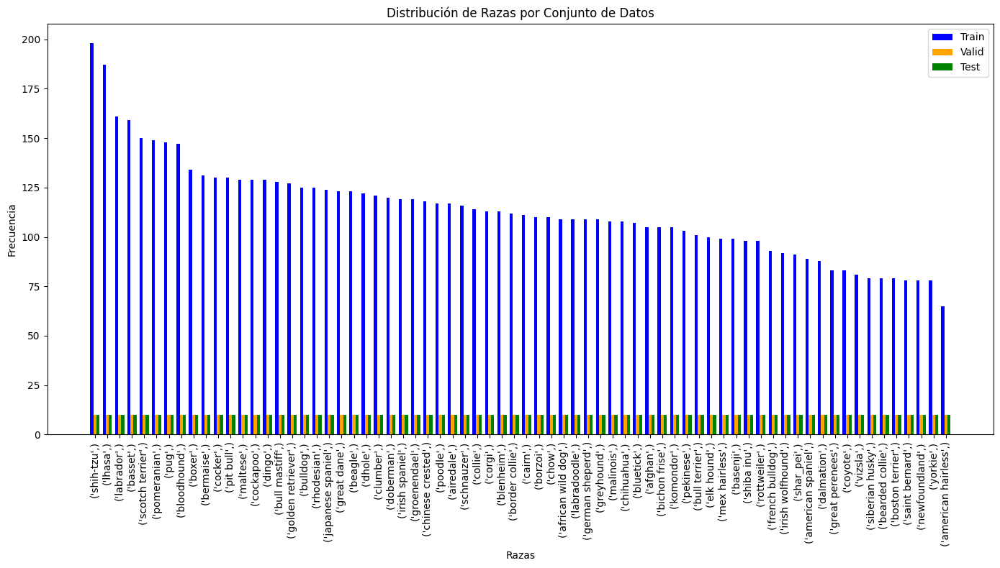

In [ ]:
import matplotlib.pyplot as plt


def plot_dataset_distribution(
    train_labels: np.ndarray[str],
    valid_labels: np.ndarray[str],
    test_labels: np.ndarray[str],
) -> None:
    # Contar la frecuencia de cada raza (label) en cada conjunto de datos
    train_distribution = pd.DataFrame(train_labels).value_counts()
    valid_distribution = pd.DataFrame(valid_labels).value_counts()
    test_distribution = pd.DataFrame(test_labels).value_counts()

    # Crear un DataFrame combinado con las distribuciones
    combined_distribution = (
        pd.DataFrame(
            {
                "train": train_distribution,
                "valid": valid_distribution,
                "test": test_distribution,
            }
        )
        .fillna(0)
        .astype(int)
    )

    #  Ordenar el DataFrame por la frecuencia total
    combined_distribution = combined_distribution.loc[
        combined_distribution.sum(axis=1).sort_values(ascending=False).index
    ]

    # Visualizar la distribución usando un gráfico de barras agrupadas
    x = np.arange(len(combined_distribution))  # Posiciones en el eje x
    width = 0.25  # Ancho de las barras

    fig, ax = plt.subplots(figsize=(14, 8))

    # Dibujar las barras para cada conjunto de datos
    bars_train = ax.bar(
        x - width, combined_distribution["train"], width, label="Train", color="blue"
    )
    bars_valid = ax.bar(
        x, combined_distribution["valid"], width, label="Valid", color="orange"
    )
    bars_test = ax.bar(
        x + width, combined_distribution["test"], width, label="Test", color="green"
    )

    # Añadir etiquetas, título y leyenda
    ax.set_xlabel("Razas")
    ax.set_ylabel("Frecuencia")
    ax.set_title("Distribución de Razas por Conjunto de Datos")
    ax.set_xticks(x)
    ax.set_xticklabels(combined_distribution.index, rotation=90)
    ax.legend()

    plt.tight_layout()
    plt.show()


plot_dataset_distribution(train_labels, valid_labels, test_labels)

Se observa que el conjunto de datos no está balanceado, ya que la clase con mayor representación, shih-tzu , cuenta con casi 200 imágenes en el conjunto de entrenamiento. En contraste, las demás clases presentan un número progresivamente menor de imágenes, llegando al extremo de la clase american hairless , que no alcanza las 75 imágenes.


In [ ]:
# Obtiene los nombres de clases únicos y ordenados alfabéticamente
class_names = np.unique(train_labels)
print(f"Total de clases: {len(class_names)}")

Total de clases: 70


In [ ]:
import tensorflow as tf
from tensorflow.keras import layers
import numpy as np
from sklearn.utils import compute_class_weight
from collections import Counter


## 1. Análisis del desbalance
def data_augmentation():
    class_counts = Counter(train_labels)
    print("Distribución original de clases:", class_counts)

    ## 2. Calcular pesos de clase y determinar el máximo
    max_samples = max(class_counts.values())

    ## 3. Pipeline de aumento de datos
    data_augmentation = tf.keras.Sequential(
        [
            layers.RandomFlip("horizontal"),
            layers.RandomFlip("vertical"),
            layers.RandomRotation(0.25),
            # layers.RandomTranslation(0.,0.25),
            # layers.RandomZoom(0.3),
            layers.RandomContrast(0.25),
            layers.RandomBrightness(0.25),
        ]
    )

    ## 4. Función para aumentar imágenes
    def augment_image(
        image: np.ndarray, num_augmentations: int = 1
    ) -> list[np.ndarray]:
        augmented_images = []
        for _ in range(num_augmentations):
            augmented_images.append(data_augmentation(image, training=True))
        return augmented_images

    ## 5. Balancear el dataset
    balanced_images = []
    balanced_labels = []

    for class_name in class_names:
        # Obtener índices de la clase actual
        class_indices = np.where(np.array(train_labels) == class_name)[0]
        num_original = len(class_indices)
        num_needed = max_samples - num_original

        if num_needed > 0:
            # Calcular cuántas aumentaciones necesitamos por imagen
            num_augmentations = int(num_needed)

            # Aumentar imágenes de esta clase
            for idx in class_indices[:num_needed]:
                original_image = train_images[idx]
                augmented = augment_image(original_image, num_augmentations=1)
                balanced_images.extend(augmented)
                balanced_labels.extend([class_name] * len(augmented))

        # Añadir las imágenes originales
        balanced_images.extend(train_images[class_indices])
        balanced_labels.extend([class_name] * num_original)

    ## 6. Convertir a arrays numpy
    balanced_images = np.array(balanced_images)
    balanced_labels = np.array(balanced_labels)
    return balanced_images, balanced_labels

Mounted at /content/drive
Distribución balanceada de clases: Counter({np.str_('afghan'): 198, np.str_('african wild dog'): 198, np.str_('airedale'): 198, np.str_('american hairless'): 198, np.str_('american spaniel'): 198, np.str_('basenji'): 198, np.str_('basset'): 198, np.str_('beagle'): 198, np.str_('bearded collie'): 198, np.str_('bermaise'): 198, np.str_('bichon frise'): 198, np.str_('blenheim'): 198, np.str_('bloodhound'): 198, np.str_('bluetick'): 198, np.str_('border collie'): 198, np.str_('borzoi'): 198, np.str_('boston terrier'): 198, np.str_('boxer'): 198, np.str_('bull mastiff'): 198, np.str_('bull terrier'): 198, np.str_('bulldog'): 198, np.str_('cairn'): 198, np.str_('chihuahua'): 198, np.str_('chinese crested'): 198, np.str_('chow'): 198, np.str_('clumber'): 198, np.str_('cockapoo'): 198, np.str_('cocker'): 198, np.str_('collie'): 198, np.str_('corgi'): 198, np.str_('coyote'): 198, np.str_('dalmation'): 198, np.str_('dhole'): 198, np.str_('dingo'): 198, np.str_('doberman

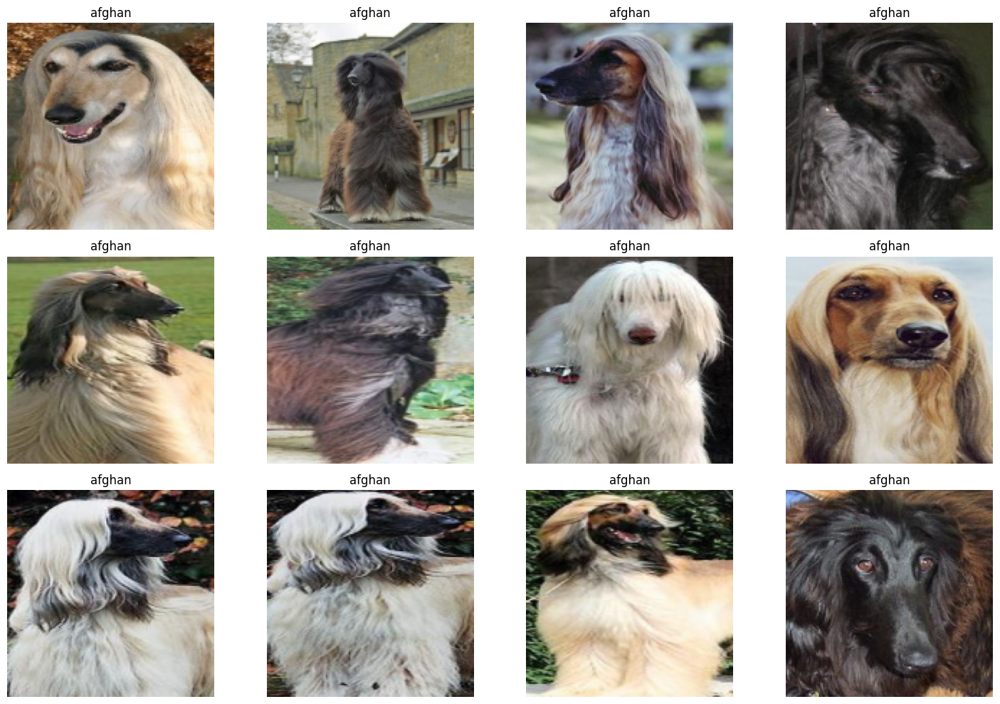

In [ ]:
from google.colab import drive, files

drive.mount("/content/drive")
# Define la ruta donde guardaste los archivos en Google Drive
save_path = "/content/drive/MyDrive/CV/"

# Lista de archivos a descargar
files_to_download = [
    "train_images.npy",
    "train_labels.npy",
    "val_images.npy",
    "val_labels.npy",
    "test_images.npy",
    "test_labels.npy",
]

# Inicializa variables para almacenar los datos
balanced_images, balanced_labels = None, None
val_images, val_labels = None, None
test_images, test_labels = None, None

# Descarga y carga cada archivo
for file_name in files_to_download:
    file_path = f"{save_path}{file_name}"

    # Carga el archivo en una variable
    if file_name == "train_images.npy":
        balanced_images = np.load(file_path)
    elif file_name == "train_labels.npy":
        balanced_labels = np.load(file_path)
    elif file_name == "val_images.npy":
        valid_images = np.load(file_path)
    elif file_name == "val_labels.npy":
        valid_labels = np.load(file_path)
    elif file_name == "test_images.npy":
        test_images = np.load(file_path)
    elif file_name == "test_labels.npy":
        test_labels = np.load(file_path)

# balanced_images, balanced_labels = data_augmentation()
## 7. Verificar el nuevo balance
balanced_counts = Counter(balanced_labels)
print("Distribución balanceada de clases:", balanced_counts)


## 9. Visualización de resultados
plt.figure(figsize=(15, 10))
for i in range(12):
    plt.subplot(3, 4, i + 1)
    plt.imshow(balanced_images[i + 100].astype("uint8"))
    plt.title(balanced_labels[i + 100])
    plt.axis("off")
plt.tight_layout()
plt.show()

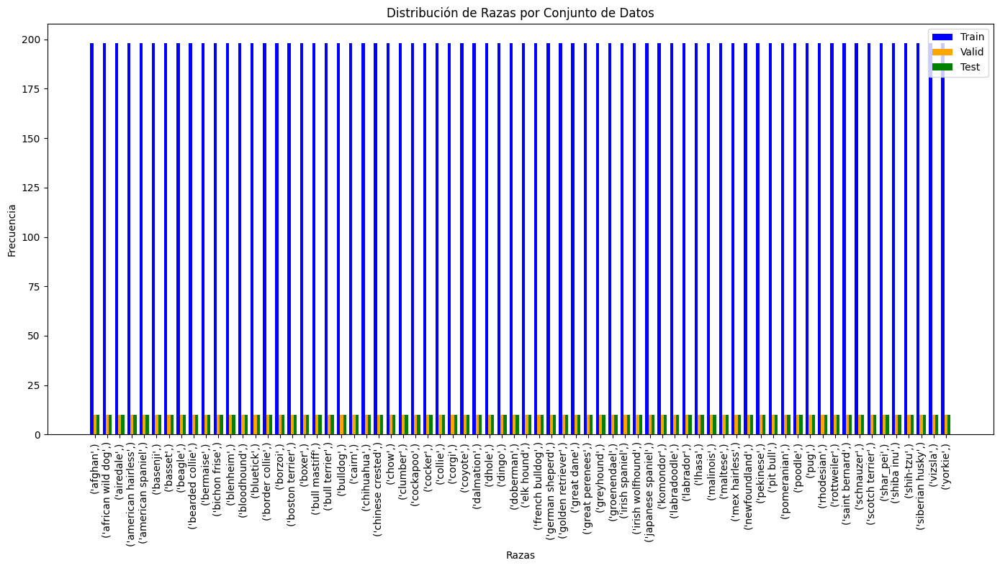

In [ ]:
plot_dataset_distribution(balanced_labels, valid_labels, test_labels)

## Base de datos vectorial


Para la base de datos vectorial se va a utilizar Faiss para la busqueda y generacion del Index. Para la generación de embeddings se va a utilizar el Modelo Resnet50.


In [ ]:
!pip install faiss-cpu --quiet

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 31.3/31.3 MB 73.3 MB/s eta 0:00:00


In [ ]:
import faiss
from tensorflow.keras.applications.resnet50 import ResNet50, preprocess_input
from tensorflow.data import Dataset
from tensorflow.keras import Model
from faiss import Index


class IndexBuilder:
    def __init__(self, dataset: np.ndarray):
        self._dataset: np.ndarray = np.copy(dataset)

    # 1. Extraer embeddings de todas las imágenes
    def _extract_features(self, model: Model, batch_size: int = 64) -> np.ndarray:
        print("Extrayendo características")
        num_images = len(self._dataset)
        all_features = []
        for i in range(0, num_images, batch_size):
            batch = self._dataset[i : i + batch_size]
            processed_batch = preprocess_input(batch)  # Shape: (batch_size, H, W, C)
            # Predicción del batch
            batch_features = model.predict(batch, verbose=0)
            all_features.append(batch_features)

        # Concatenar todos los batches
        return np.concatenate(all_features, axis=0)

    # 2. Construir índice FAISS
    def build_faiss_index(self, model: Model) -> Index:
        features = self._extract_features(model)
        print("Construyendo índice FAISS...")
        dimension = features.shape[
            1
        ]  # Dimensión de los embeddings (2048 para ResNet50)
        index = faiss.IndexFlatL2(dimension)  # Usamos distancia L2 (Euclidiana)
        index.add(features.astype("float32"))  # FAISS requiere float32
        return index

In [ ]:
!pip install gdown --quiet
import gdown

IMAGE_HEIGHT = 144
IMAGE_WIDTH = 144
# Cargar modelo y extraer características
model_resnet50 = ResNet50(
    weights="imagenet",
    include_top=False,
    pooling="avg",
    input_shape=(IMAGE_HEIGHT, IMAGE_WIDTH, 3),
)

index_builder = IndexBuilder(balanced_images)
# Construir índice FAISS
gdown.download(
    "https://drive.google.com/uc?id=195i8aVFsqO335MVDQmBXxkI0p89UgTrx",
    "index_resnet50.faiss",
    quiet=False,
)

if os.path.exists("index_resnet50.faiss"):
    index_resnet50 = faiss.read_index("index_resnet50.faiss")
else:
    index_resnet50 = index_builder.build_faiss_index(model_resnet50)
    faiss.write_index(index_resnet50, "index_resnet50.faiss")

94765736/94765736 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


Downloading...
From (original): https://drive.google.com/uc?id=195i8aVFsqO335MVDQmBXxkI0p89UgTrx
From (redirected): https://drive.google.com/uc?id=195i8aVFsqO335MVDQmBXxkI0p89UgTrx&confirm=t&uuid=fd1ca2c8-6ca8-4300-9425-99a5d431534c
To: /content/index_resnet50.faiss
100%|██████████| 114M/114M [00:02<00:00, 48.4MB/s]


## Buscador por similitud


In [ ]:
import gradio as gr
from sklearn.metrics import ndcg_score


class DogSearchEngine:
    def __init__(
        self,
        model: Model,
        index: Index,
        images: np.ndarray[np.ndarray],
        labels: np.ndarray[str],
    ):
        self.model = model
        self.index = index
        self.all_images = images
        self.all_labels = labels
        self.image_size = (144, 144)

    def search(
        self, input_image: np.ndarray, k: int = 10
    ) -> tuple[np.ndarray, list[np.ndarray], list[str], list[float]]:
        """Busca perros similares en la base de datos"""
        # Preprocesar imagen de entrada
        processed_img = self._preprocess_image(input_image)
        input_tensor = tf.expand_dims(processed_img, axis=0)
        # input_tensor = preprocess_input(input_tensor)
        # Extraer características
        input_features = self.model.predict(input_tensor, verbose=0).astype("float32")

        # Buscar imágenes similares
        distances, indices = self.index.search(input_features, k)

        # Obtener resultados
        similar_images = self.all_images[indices[0]]
        similar_classes = [self.all_labels[idx] for idx in indices[0]]
        distances = distances[0]

        # Convertir imágenes a formato adecuado para Gradio (uint8 [0-255])
        similar_images = [(img).astype(np.uint8) for img in similar_images]

        return input_image, similar_images, similar_classes, distances

    def evaluate(
        self, image: np.ndarray, k=10
    ) -> tuple[np.ndarray, list[np.ndarray], list[str], list[float], str]:
        """Evalúa la imagen y determina la raza más probable por voto mayoritario"""
        # Realizar la búsqueda de imágenes similares
        input_image, similar_images, similar_classes, distances = self.search(image, k)

        # Contar las ocurrencias de cada clase
        class_counts = {}
        for class_name in similar_classes:
            if class_name in class_counts:
                class_counts[class_name] += 1
            else:
                class_counts[class_name] = 1

        # Obtener la clase con mayor conteo
        predicted_class = max(class_counts.items(), key=lambda x: x[1])[0]

        return input_image, similar_images, similar_classes, distances, predicted_class

    def _preprocess_image(self, image: np.ndarray) -> np.ndarray:
        """Preprocesa una imagen para el modelo"""
        image = cv2.resize(image, self.image_size)
        # image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        return preprocess_input(image)

    def ndcg(
        self, images: np.ndarray[np.ndarray], true_labels: np.ndarray[str], k: int = 10
    ):
        ndcg_scores = []

        for img, true_label in zip(images, true_labels):
            # Obtener resultados de búsqueda
            _, _, similar_classes, distances, _ = self.evaluate(img, k=k)
            # Calcular relevancias
            relevances = [1 if (cls == true_label) else 0 for cls in similar_classes]

            # Calcular NDCG
            try:
                ndcg = ndcg_score(
                    [relevances],
                    [-np.array(distances)],  # Invertimos distancias
                    k=k,
                )
                ndcg_scores.append(ndcg)
            except Exception as e:
                print(f"Error calculating NDCG: {e}")
                ndcg_scores.append(0.0)

        avg_ndcg = np.mean(ndcg_scores) if ndcg_scores else 0.0
        return ndcg_scores, avg_ndcg

In [ ]:
engine = DogSearchEngine(
    model_resnet50, index_resnet50, balanced_images, balanced_labels
)

## Gradio


In [ ]:
class GradioInterface:
    def __init__(self, search_engine, title: str, description: str):
        self.search_engine = search_engine
        self.title = title
        self.description = description

    def process_image_common(
        self, input_image: np.ndarray, model_name: str = None, k: int = 10
    ):
        if model_name:
            self.search_engine.set_model(model_name)

        input_img, similar_imgs, classes, distances, predicted_class = (
            self.search_engine.evaluate(input_image, k=k)
        )

        # Convertir imagen de entrada a uint8
        input_img = input_img.astype(np.uint8)

        # Preparar resultados para visualización
        results = [
            (img, f"{cls} (Sim: {100 * (1 - dist / max(distances)):.1f}%)")
            for img, cls, dist in zip(similar_imgs, classes, distances)
        ]

        return input_img, predicted_class, results

    def create_interface(
        self, inputs, outputs, process_fn, submit_label="Buscar Similares"
    ):
        with gr.Blocks(title=self.title, theme=gr.themes.Soft()) as app:
            gr.Markdown(f"# 🐶 {self.title}")
            gr.Markdown(self.description)

            with gr.Row():
                with gr.Column(scale=1):
                    for input_component in inputs:
                        input_component.render()

                    submit_btn = gr.Button(submit_label, variant="primary")

                with gr.Column(scale=2):
                    for output_component in outputs:
                        output_component.render()

            submit_btn.click(
                fn=process_fn,
                inputs=[input_component for input_component in inputs],
                outputs=[output_component for output_component in outputs],
            )

        return app

    def launch(
        self,
        inputs,
        outputs,
        process_fn,
        submit_label="Buscar Similares",
        share=True,
        debug=True,
    ):
        app = self.create_interface(inputs, outputs, process_fn, submit_label)
        app.launch(share=share, debug=debug)

In [ ]:
class DogSearchInterface(GradioInterface):
    def __init__(self, search_engine: DogSearchEngine):
        super().__init__(
            search_engine=search_engine,
            title="Buscador de Razas de Perros",
            description="Sube una imagen de perro para encontrar las razas más similares en nuestra base de datos",
        )

    def process_image(self, input_image: np.ndarray):
        return self.process_image_common(input_image)

    def launch(self):
        inputs = [gr.Image(label="Imagen de entrada", type="numpy", height=300)]
        outputs = [
            gr.Image(label="Tu imagen", interactive=False, height=300),
            gr.Label(label="Raza predicha", container=True),
            gr.Gallery(
                label="Resultados (10 más similares)",
                columns=5,
                rows=2,
                object_fit="cover",
                height="auto",
            ),
        ]
        super().launch(inputs, outputs, self.process_image)

In [ ]:
gradio_interface = DogSearchInterface(engine)
gradio_interface.launch()

Colab notebook detected. This cell will run indefinitely so that you can see errors and logs. To turn off, set debug=False in launch().
* Running on public URL: https://f1773362f70dbeaada.gradio.live

This share link expires in 1 week. For free permanent hosting and GPU upgrades, run `gradio deploy` from the terminal in the working directory to deploy to Hugging Face Spaces (https://huggingface.co/spaces)


Keyboard interruption in main thread... closing server.
Killing tunnel 127.0.0.1:7860 <> https://f1773362f70dbeaada.gradio.live


## Score sin data augmentation


In [ ]:
# index_builder_train = IndexBuilder(train_images)
# index_resnet50_train= index_builder.build_faiss_index(model_resnet50)
# engine = DogSearchEngine(model_resnet50, index_resnet50, train_images, train_labels)

# ndcg_scores, avg_ndcg = engine.ndcg(test_images, test_labels)
# print(f"NDCG@10 promedio: {avg_ndcg:.4f}")
# print(f"Scores individuales: {ndcg_scores}")

NDCG@10 promedio: 0.7821
Scores individuales: [np.float64(0.9842184869190971), np.float64(0.7720911544214066), np.float64(0.9815441540827995), np.float64(1.0), np.float64(0.9851514063429594), np.float64(0.9338192602341808), np.float64(1.0), np.float64(0.9617010886504508), np.float64(0.8070380459557518), np.float64(0.9671081267272547), np.float64(0.9135277613190136), np.float64(0.9770153702993118), np.float64(0.9918291064614977), np.float64(0.9498751896215564), np.float64(0.8726787744521319), np.float64(1.0), np.float64(0.9950883841893561), np.float64(1.0), np.float64(0.9963488021549353), np.float64(1.0), np.float64(0.0), np.float64(0.7613569414627898), np.float64(0.0), np.float64(0.0), np.float64(0.0), np.float64(0.0), np.float64(0.6196686079396532), np.float64(0.8918195074012366), np.float64(0.9672068480996275), np.float64(0.5741603094598835), np.float64(0.4914152748433091), np.float64(0.486008990027871), np.float64(0.5937751258332796), np.float64(0.0), np.float64(0.9217868789962073),

## Score con data augmentation


In [ ]:
ndcg_scores, avg_ndcg = engine.ndcg(test_images, test_labels)
print(f"NDCG@10 promedio: {avg_ndcg:.4f}")
print(f"Scores individuales: {ndcg_scores}")

NDCG@10 promedio: 0.8392
Scores individuales: [np.float64(0.9766325382721556), np.float64(1.0), np.float64(1.0), np.float64(1.0), np.float64(1.0), np.float64(0.9530418785472456), np.float64(1.0), np.float64(0.9010126104210694), np.float64(0.8598410759517515), np.float64(0.958080399528401), np.float64(0.9971876401972101), np.float64(1.0), np.float64(1.0), np.float64(1.0), np.float64(0.9752652438087495), np.float64(1.0), np.float64(1.0), np.float64(0.5260721334578812), np.float64(1.0), np.float64(0.9165542635924872), np.float64(0.6309297535714573), np.float64(0.9842184869190971), np.float64(0.0), np.float64(0.38685280723454163), np.float64(0.38685280723454163), np.float64(0.0), np.float64(0.944740375813847), np.float64(0.9971876401972101), np.float64(1.0), np.float64(0.9860433320650157), np.float64(1.0), np.float64(0.3154648767857289), np.float64(0.905865301574308), np.float64(0.6394562303262415), np.float64(0.3333333333333335), np.float64(1.0), np.float64(1.0), np.float64(0.949388568485

Se puede observar como luego de aplicar data augmentation al dataset logrando balancear las clases minoritarias se obtiene una mejora de mas del 5% (de 0.7821 a 0.8392) en el NDCG@10 score promedio. Este valor representa un desempeño relativamente alto, ya que indica que el modelo está alcanzando aproximadamente el 83.92% de la calidad máxima posible en términos de ranking, priorizando correctamente las clases más relevantes en las primeras posiciones de la lista.

De esto se puede concluir que el tener las clases balanceadas en el dataset tiene un impacto significativo en el rendimiento del modelo, especialmente en métricas como el NDCG@10, que evalúan la capacidad del sistema para priorizar correctamente las clases más relevantes.


# Etapa 2


## Entrenemiento y evaluacion


In [ ]:
# Check if GPU is available and list devices
gpus = tf.config.list_physical_devices("GPU")
if gpus:
    print("Num GPUs Available:", len(gpus))
    for gpu in gpus:
        print("Name:", gpu.name, "Type:", gpu.device_type)
else:
    print("No GPU found. TensorFlow will use CPU.")

Num GPUs Available: 1
Name: /physical_device:GPU:0 Type: GPU


In [ ]:
import seaborn as sns
from sklearn.metrics import classification_report, confusion_matrix
from collections import Counter


def train_test(
    model,
    train_images,
    train_labels_str,
    val_images,
    val_labels_str,
    test_images,
    test_labels_str,
    initial_lr,
):
    """
    Entrena y evalúa un modelo de clasificación de imágenes con etiquetas string.

    Args:
        model: Modelo de Keras a entrenar
        train_images: Imágenes de entrenamiento (np.array o tensor)
        train_labels_str: Etiquetas de entrenamiento (list/array de strings)
        val_images: Imágenes de validación
        val_labels_str: Etiquetas de validación (strings)
        test_images: Imágenes de test
        test_labels_str: Etiquetas de test (strings)
        initial_lr: Tasa de aprendizaje inicial
    """

    # ========================================================================
    # 1. VALIDACIÓN Y PREPARACIÓN DE DATASET
    # ========================================================================

    # Determinar los nombres de las clases si no se proporcionan
    class_names = sorted(set(train_labels_str))

    # Mapeo de etiquetas a índices
    class_to_idx = {cls_name: idx for idx, cls_name in enumerate(class_names)}
    num_classes = len(class_names)

    # Función para convertir a one-hot encoding
    def labels_to_onehot(str_labels):
        indices = [class_to_idx[label] for label in str_labels]
        return tf.keras.utils.to_categorical(indices, num_classes=num_classes)

    # Convertir todas las etiquetas
    train_labels = labels_to_onehot(train_labels_str)
    val_labels = labels_to_onehot(val_labels_str)
    test_labels = labels_to_onehot(test_labels_str)

    # Crear datasets TensorFlow
    def create_dataset(images, labels):
        return tf.data.Dataset.from_tensor_slices((images, labels))

    batch_size = 128
    train_ds = create_dataset(train_images, train_labels)
    val_ds = create_dataset(val_images, val_labels)
    test_ds = create_dataset(test_images, test_labels)

    # Mejorar el pipeline de datos
    train_ds = (
        train_ds.shuffle(buffer_size=len(train_images), reshuffle_each_iteration=True)
        .batch(batch_size)
        .prefetch(tf.data.AUTOTUNE)
    )

    val_ds = val_ds.batch(batch_size).prefetch(tf.data.AUTOTUNE)
    test_ds = test_ds.batch(batch_size).prefetch(tf.data.AUTOTUNE)

    # ========================================================================
    # 2. ENTRENAMIENTO DEL MODELO
    # ========================================================================

    # Compilar el modelo
    model.compile(
        optimizer=tf.keras.optimizers.Adam(learning_rate=initial_lr),
        loss="categorical_crossentropy",
        metrics=["accuracy"],
    )

    # Callbacks
    callbacks = [
        tf.keras.callbacks.EarlyStopping(
            monitor="val_accuracy",
            patience=15,
            mode="max",
            restore_best_weights=True,
            verbose=1,
        ),
        tf.keras.callbacks.ReduceLROnPlateau(
            monitor="val_accuracy", factor=0.5, patience=8, min_lr=1e-6, verbose=1
        ),
        tf.keras.callbacks.ModelCheckpoint(
            filepath=f"{model.name}.weights.h5",
            monitor="val_accuracy",
            save_best_only=True,
            mode="min",
            save_weights_only=True,
        ),
    ]

    # Entrenamiento
    print("\nIniciando entrenamiento...")
    history = model.fit(
        train_ds, epochs=1000, validation_data=val_ds, callbacks=callbacks, verbose=1
    )

    # ========================================================================
    # 3. EVALUACIÓN Y VISUALIZACIÓN
    # ========================================================================

    # Ploteamos accuracy
    plt.figure(figsize=(10, 5))
    plt.plot(history.history["accuracy"], label="accuracy")
    plt.plot(history.history["val_accuracy"], label="val_accuracy")
    plt.xlabel("Epoch")
    plt.title(f"Entrenamiento de {model.name}")
    plt.ylabel("Accuracy")
    plt.legend(loc="upper right")
    plt.show()

    # Ploteamos loss
    plt.figure(figsize=(10, 5))
    plt.plot(history.history["loss"], label="loss")
    plt.plot(history.history["val_loss"], label="val_loss")
    plt.xlabel("Epoch")
    plt.title(f"Entrenamiento de {model.name}")
    plt.ylabel("Loss")
    plt.legend(loc="upper right")
    plt.show()

    # Evaluación final
    print("\nEvaluación en conjunto de test:")
    test_results = model.evaluate(test_ds, verbose=1)
    print("\nMétricas de test:")
    for name, value in zip(model.metrics_names, test_results):
        print(f"{name}: {value:.4f}")

    # Predecir en todo el conjunto de test
    test_images_all = np.concatenate([x for x, _ in test_ds], axis=0)
    y_true = np.concatenate([y.numpy() for _, y in test_ds], axis=0)
    y_true_labels = np.argmax(y_true, axis=1)
    y_pred_probs = model.predict(test_images_all, verbose=0)
    y_pred_labels = np.argmax(y_pred_probs, axis=1)

    # Reporte de clasificación
    print("\nReporte de Clasificación:")
    print(
        classification_report(
            y_true_labels, y_pred_labels, target_names=class_names, digits=4
        )
    )

    # Visualización de predicciones
    plt.figure(figsize=(15, 15))
    for images, labels in test_ds.take(1):
        preds = model.predict(images, verbose=0)
        for i in range(min(9, len(images))):
            ax = plt.subplot(3, 3, i + 1)
            plt.imshow(images[i].numpy().astype("uint8"))
            true_idx = np.argmax(labels[i])
            pred_idx = np.argmax(preds[i])
            confidence = np.max(preds[i])

            title_color = "green" if true_idx == pred_idx else "red"
            plt.title(
                f"True: {class_names[true_idx]}\nPred: {class_names[pred_idx]} ({confidence:.2f})",
                color=title_color,
            )
            plt.axis("off")
    plt.tight_layout()
    plt.show()

    return history

Con esta pipeline se pretende:

1. Validar y preparar el dataset para entrenar, validar y testear el modelo asegurandose de la correcta conversion de las clases a one-hot, la genereción del los tf.Dataset y su correcta configuracion

2. Entrenar el modelo. Aquí, el modelo se compila utilizando el optimizador Adam, la función de pérdida categorical_crossentropy y la métrica de precisión (accuracy). Durante el entrenamiento, se implementan callbacks avanzados como EarlyStopping, que detiene el proceso si no hay mejoras en la validación, ReduceLROnPlateau, que ajusta dinámicamente la tasa de aprendizaje, y ModelCheckpoint, que guarda los pesos del modelo con el mejor rendimiento.

3. Evalúa y visualizar el rendimiento del modelo. Se generan gráficos de precisión y pérdida para analizar la evolución del entrenamiento y la validación. Luego, el modelo se evalúa en el conjunto de prueba, reportando métricas finales como pérdida y precisión. Además, se proporciona un informe de clasificación detallado que incluye precisión, recall y F1-score para cada clase, lo que ayuda a identificar posibles problemas de desempeño en clases específicas.


## Modelos


### Convolucional


In [ ]:
from keras.layers import (
    Input,
    RandomFlip,
    RandomContrast,
    RandomTranslation,
    Flatten,
    Dropout,
)
from keras.layers import (
    Dense,
    Conv2D,
    Activation,
    MaxPooling2D,
    GlobalMaxPooling2D,
    Rescaling,
    GlobalAveragePooling2D,
)


def build_model(input_shape, output_labels):
    i = Input(input_shape, dtype=tf.float32)

    x = Rescaling(1.0 / 255)(i)

    x = Conv2D(16, (3, 3))(x)
    x = Activation("relu")(x)
    x = Conv2D(16, (3, 3))(x)
    x = Activation("relu")(x)
    x = MaxPooling2D((2, 2))(x)

    x = Conv2D(32, (3, 3))(x)
    x = Activation("relu")(x)
    x = Conv2D(32, (3, 3))(x)
    x = Activation("relu")(x)
    x = MaxPooling2D((2, 2))(x)

    x = Conv2D(64, (3, 3))(x)
    x = Activation("relu")(x)
    x = Conv2D(64, (3, 3))(x)
    x = Activation("relu")(x)
    x = GlobalMaxPooling2D()(x)

    # x = Flatten()(x)
    x = Dense(1024, activation="relu")(x)
    x = Dropout(0.3)(x)
    x = Dense(1024, activation="relu", name="densa_embbeding")(x)
    x = Dropout(0.3)(x)
    x = Dense(output_labels)(x)
    x = Activation("softmax")(x)
    return tf.keras.Model(inputs=i, outputs=x, name="modelo_convolucional")

In [ ]:
modelo_convolucional = build_model((144, 144, 3), len(class_names))
modelo_convolucional.summary()

Model: "modelo_convolucional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_1 (InputLayer)      │ (None, 144, 144, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ rescaling (Rescaling)           │ (None, 144, 144, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d (Conv2D)                 │ (None, 142, 142, 16)   │           448 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation (Activation)         │ (None, 142, 142, 16)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 140, 140, 16)   │         2,320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_1 (Activation)       │ (None, 140, 140, 16)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 70, 70, 16)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 68, 68, 32)     │         4,640 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_2 (Activation)       │ (None, 68, 68, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 66, 66, 32)     │         9,248 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_3 (Activation)       │ (None, 66, 66, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 33, 33, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_4 (Conv2D)               │ (None, 31, 31, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_4 (Activation)       │ (None, 31, 31, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_5 (Conv2D)               │ (None, 29, 29, 64)     │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_5 (Activation)       │ (None, 29, 29, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_max_pooling2d            │ (None, 64)             │             0 │
│ (GlobalMaxPooling2D)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 1024)           │        66,560 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 1024)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ densa_embbeding (Dense)         │ (None, 1024)           │     1,049,600 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 1024)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 70)             │        71,750 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_6 (Activation)       │ (None, 70)             │             0 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 1,259,990 (4.81 MB)

 Trainable params: 1,259,990 (4.81 MB)

 Non-trainable params: 0 (0.00 B)


Iniciando entrenamiento...
Epoch 1/1000
109/109 ━━━━━━━━━━━━━━━━━━━━ 37s 194ms/step - accuracy: 0.0144 - loss: 4.2483 - val_accuracy: 0.0314 - val_loss: 4.2348 - learning_rate: 1.0000e-04
Epoch 2/1000
109/109 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - accuracy: 0.0263 - loss: 4.1672 - val_accuracy: 0.0314 - val_loss: 4.0285 - learning_rate: 1.0000e-04
Epoch 3/1000
109/109 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - accuracy: 0.0342 - loss: 4.0424 - val_accuracy: 0.0329 - val_loss: 4.0003 - learning_rate: 1.0000e-04
Epoch 4/1000
109/109 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - accuracy: 0.0422 - loss: 4.0154 - val_accuracy: 0.0386 - val_loss: 3.9671 - learning_rate: 1.0000e-04
Epoch 5/1000
109/109 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - accuracy: 0.0434 - loss: 3.9818 - val_accuracy: 0.0429 - val_loss: 3.9283 - learning_rate: 1.0000e-04
Epoch 6/1000
109/109 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - accuracy: 0.0575 - loss: 3.9285 - val_accuracy: 0.0500 - val_loss: 3.8751 - learning_rate: 1.0000e-04
Epoch 7/1000
109

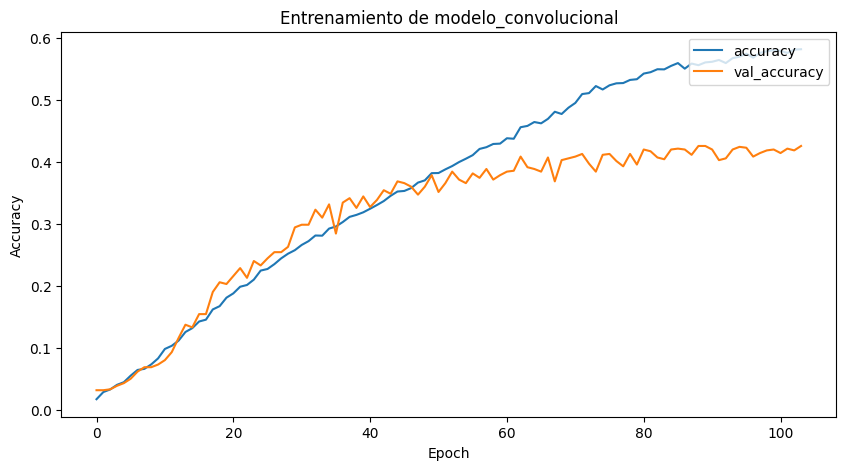

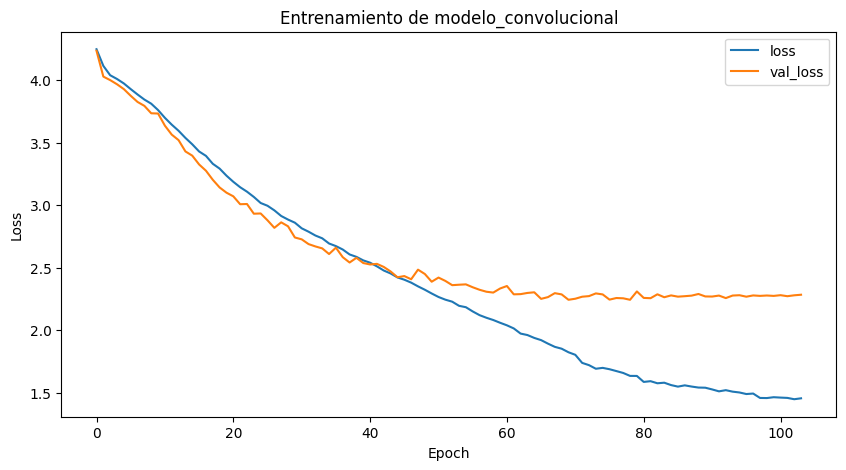


Evaluación en conjunto de test:
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.4604 - loss: 2.3799 

Métricas de test:
loss: 2.3927
compile_metrics: 0.4429

Reporte de Clasificación:
                   precision    recall  f1-score   support

           afghan     0.2500    0.1000    0.1429        10
 african wild dog     0.4545    0.5000    0.4762        10
         airedale     0.4545    0.5000    0.4762        10
american hairless     0.3636    0.4000    0.3810        10
 american spaniel     0.5000    0.6000    0.5455        10
          basenji     0.4545    0.5000    0.4762        10
           basset     0.3571    0.5000    0.4167        10
           beagle     0.6364    0.7000    0.6667        10
   bearded collie     0.5455    0.6000    0.5714        10
         bermaise     0.6364    0.7000    0.6667        10
     bichon frise     0.6000    0.9000    0.7200        10
         blenheim     0.5833    0.7000    0.6364        10
       bloodhound     0.3000    0.3000    0.

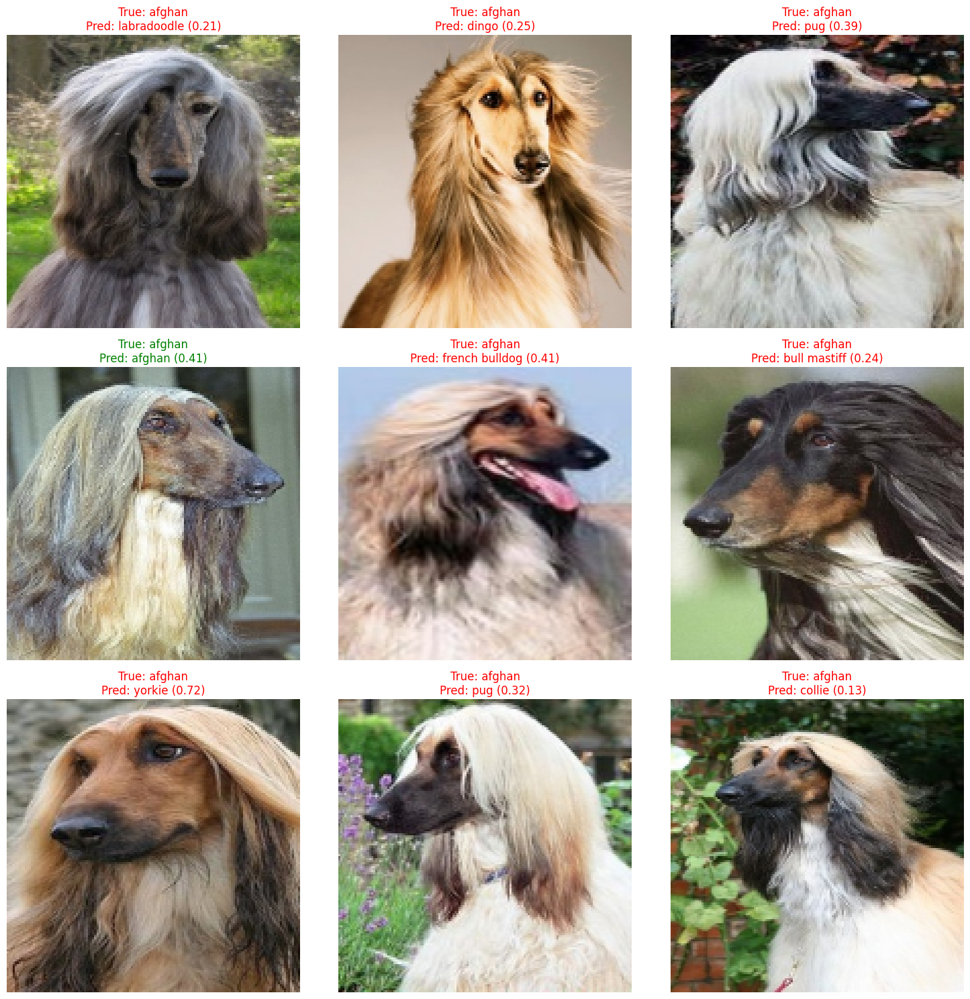

In [ ]:
# train_test(modelo_convolucional,balanced_images, balanced_labels, valid_images, valid_labels, test_images, test_labels,0.0001)

Se observa que el modelo convolucional desde cero no logra obtener un buen rendimiento clasificando las imagenes de los perros, con accuracy de testeo de 0.46, un recall y f1-score de 0.44 y 0.42 respectivamente.


### Resnet50 Finetuning


In [ ]:
def build_model(input_shape, num_classes):
    base_model = tf.keras.applications.ResNet50(
        input_shape=input_shape, include_top=False, pooling="avg", weights="imagenet"
    )
    base_model.trainable = False

    i = Input(shape=input_shape)
    x = base_model(i, training=False)
    x = Dense(1024, activation="relu")(x)
    x = Dropout(0.3)(x)
    x = Dense(2048, activation="relu", name="densa_embbeding")(x)
    x = Dropout(0.3)(x)
    x = Dense(num_classes, activation="softmax")(x)

    return tf.keras.Model(i, x, name="modelo_transfer_learning")

In [ ]:
modelo_transfer_learning = build_model((144, 144, 3), len(class_names))
modelo_transfer_learning.summary()

Model: "modelo_transfer_learning"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_3 (InputLayer)      │ (None, 144, 144, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ resnet50 (Functional)           │ (None, 2048)           │    23,587,712 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 1024)           │     2,098,176 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 1024)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ densa_embbeding (Dense)         │ (None, 2048)           │     2,099,200 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_3 (Dropout)             │ (None, 2048)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 70)             │       143,430 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 27,928,518 (106.54 MB)

 Trainable params: 4,340,806 (16.56 MB)

 Non-trainable params: 23,587,712 (89.98 MB)


Iniciando entrenamiento...
Epoch 1/1000
109/109 ━━━━━━━━━━━━━━━━━━━━ 28s 127ms/step - accuracy: 0.1537 - loss: 3.7079 - val_accuracy: 0.7529 - val_loss: 0.9356 - learning_rate: 1.0000e-04
Epoch 2/1000
109/109 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step - accuracy: 0.5058 - loss: 1.8255 - val_accuracy: 0.8100 - val_loss: 0.6222 - learning_rate: 1.0000e-04
Epoch 3/1000
109/109 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step - accuracy: 0.6034 - loss: 1.4104 - val_accuracy: 0.8371 - val_loss: 0.5121 - learning_rate: 1.0000e-04
Epoch 4/1000
109/109 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - accuracy: 0.6508 - loss: 1.2266 - val_accuracy: 0.8643 - val_loss: 0.4334 - learning_rate: 1.0000e-04
Epoch 5/1000
109/109 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step - accuracy: 0.6950 - loss: 1.0573 - val_accuracy: 0.8757 - val_loss: 0.3986 - learning_rate: 1.0000e-04
Epoch 6/1000
109/109 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - accuracy: 0.7267 - loss: 0.9449 - val_accuracy: 0.8829 - val_loss: 0.3860 - learning_rate: 1.0000e-04
Epoch 7/1000
109

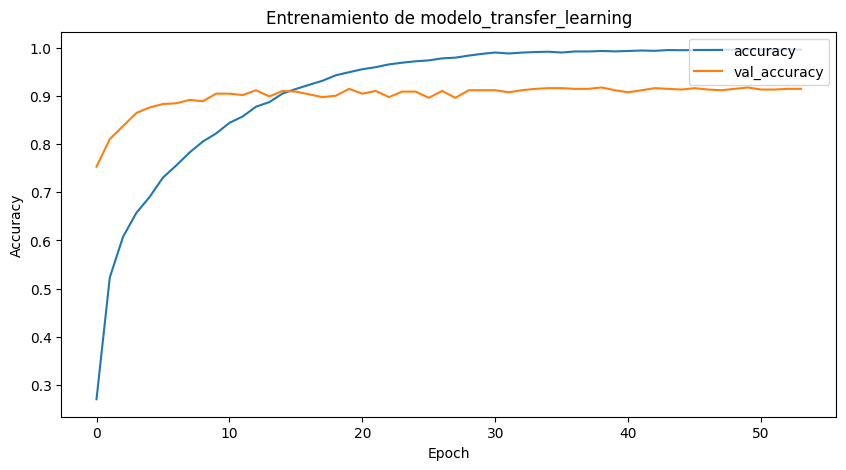

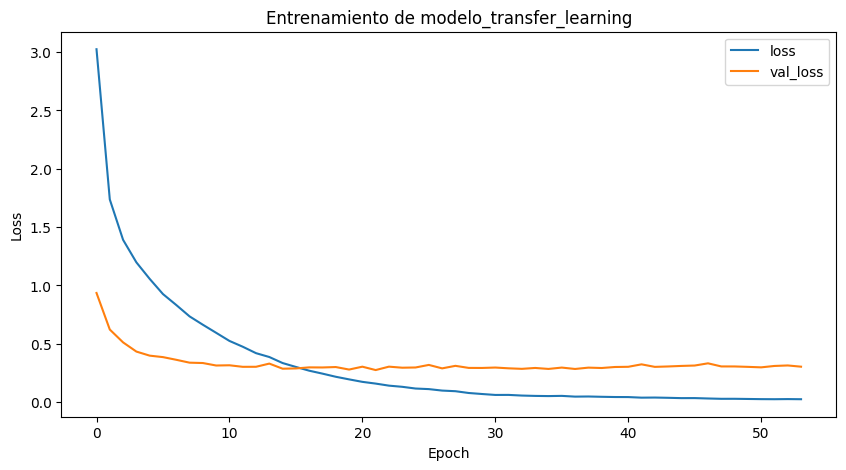


Evaluación en conjunto de test:
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.8882 - loss: 0.4544

Métricas de test:
loss: 0.4626
compile_metrics: 0.8871

Reporte de Clasificación:
                   precision    recall  f1-score   support

           afghan     0.9091    1.0000    0.9524        10
 african wild dog     1.0000    1.0000    1.0000        10
         airedale     0.9000    0.9000    0.9000        10
american hairless     0.9000    0.9000    0.9000        10
 american spaniel     0.6364    0.7000    0.6667        10
          basenji     0.7692    1.0000    0.8696        10
           basset     1.0000    1.0000    1.0000        10
           beagle     1.0000    0.9000    0.9474        10
   bearded collie     1.0000    0.8000    0.8889        10
         bermaise     1.0000    0.9000    0.9474        10
     bichon frise     1.0000    1.0000    1.0000        10
         blenheim     1.0000    0.9000    0.9474        10
       bloodhound     1.0000    0.9000    0.

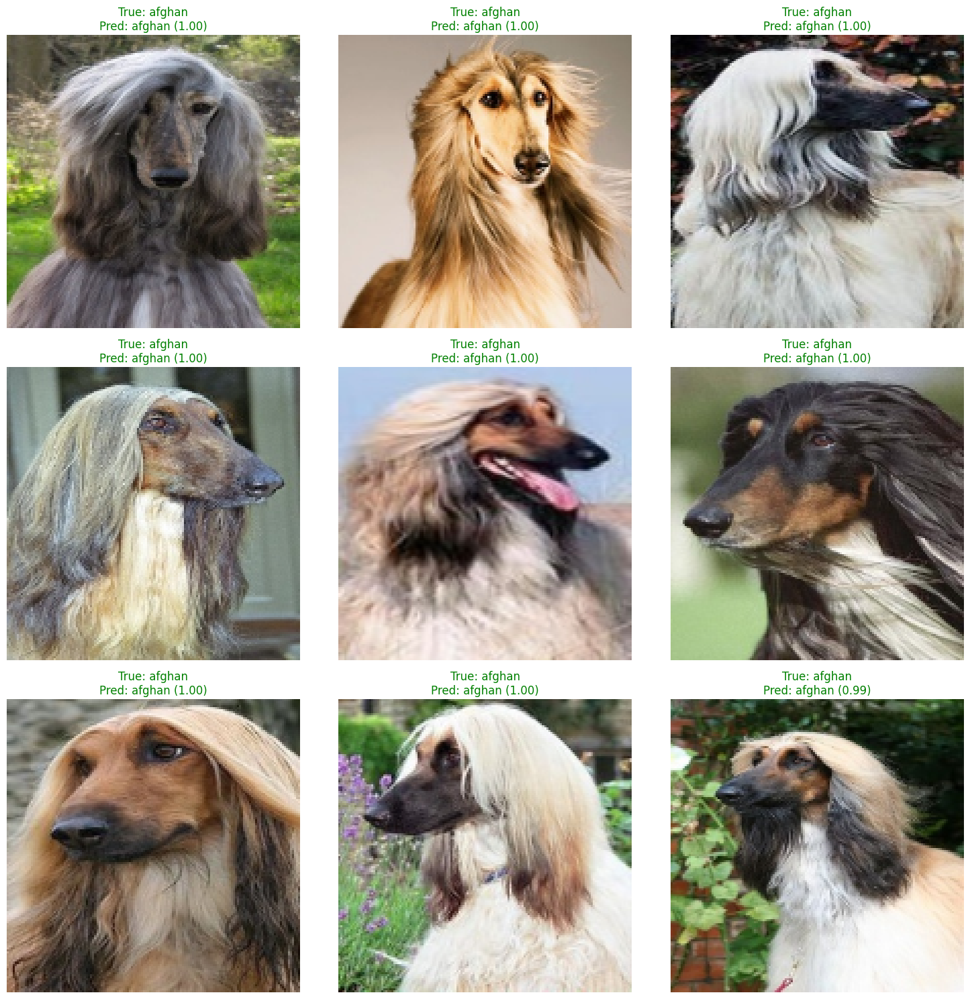

In [ ]:
# train_test(modelo_transfer_learning,balanced_images, balanced_labels, valid_images, valid_labels, test_images, test_labels,0.0001)

Se observa un buen desempeño del modelo Resnet50 comparado con el modelo CNN, logrando un accuracy de 0.88 en el dataset de testeo, con un recall promedio de 0.88 y un f1-score promedio 0.88. Tambien se observa que no hay ninguna clase individual en donde el rendimiento de alguna de estas tres metricas caiga por debajo del 0.5


## Carga de modelos


In [ ]:
# URL base de Google Drive
url_base = "https://drive.google.com/uc?id="

# IDs de los archivos
id_transfer_learning = "146UrXPo-IyTUXLJlDHcGodcEByYfsvSB"
id_convolucional = "1svjBTN_EyOxM5PsZ9OtrdKsJmOX-8oDE"

# Descargar los archivos
gdown.download(
    url_base + id_transfer_learning, "modelo_transfer_learning.weights.h5", quiet=False
)
gdown.download(
    url_base + id_convolucional, "modelo_convolucional.weights.h5", quiet=False
)

# Cargar los pesos en los modelos
modelo_transfer_learning.load_weights("modelo_transfer_learning.weights.h5")
capa_embbeding = modelo_transfer_learning.get_layer("densa_embbeding").output
modelo_transfer_embbeding = tf.keras.Model(
    inputs=modelo_transfer_learning.input, outputs=capa_embbeding
)

modelo_convolucional.load_weights("modelo_convolucional.weights.h5")
capa_embbeding = modelo_convolucional.get_layer("densa_embbeding").output
modelo_convolucional_embbeding = tf.keras.Model(
    inputs=modelo_convolucional.input, outputs=capa_embbeding
)

print("Pesos cargados exitosamente.")

Downloading...
From (original): https://drive.google.com/uc?id=146UrXPo-IyTUXLJlDHcGodcEByYfsvSB
From (redirected): https://drive.google.com/uc?id=146UrXPo-IyTUXLJlDHcGodcEByYfsvSB&confirm=t&uuid=0f908806-f08d-4e05-8535-037f1d482f49
To: /content/modelo_transfer_learning.weights.h5
100%|██████████| 147M/147M [00:02<00:00, 56.6MB/s]
Downloading...
From: https://drive.google.com/uc?id=1svjBTN_EyOxM5PsZ9OtrdKsJmOX-8oDE
To: /content/modelo_convolucional.weights.h5
100%|██████████| 15.2M/15.2M [00:00<00:00, 40.0MB/s]


Pesos cargados exitosamente.


## Nuevos Indexes


In [ ]:
gdown.download(
    "https://drive.google.com/uc?id=1_yaSAUFeodcyHXxoPhnAVun8HPQNXHAQ",
    "index_transfer_learning.faiss",
    quiet=False,
)
gdown.download(
    "https://drive.google.com/uc?id=1s49OvaYqTqSnI7l_xOepQZESJcItTTr0",
    "index_convolucional.faiss",
    quiet=False,
)

if os.path.exists("index_transfer_learning.faiss"):
    index_transfer_learning = faiss.read_index("index_transfer_learning.faiss")
    index_convolucional = faiss.read_index("index_convolucional.faiss")
else:
    index_builder = IndexBuilder(balanced_images)
    index_transfer_learning = index_builder.build_faiss_index(modelo_transfer_embbeding)
    faiss.write_index(index_transfer_learning, "index_transfer_learning.faiss")
    index_convolucional = index_builder.build_faiss_index(
        modelo_convolucional_embbeding
    )
    faiss.write_index(index_convolucional, "index_convolucional.faiss")

Downloading...
From (original): https://drive.google.com/uc?id=1_yaSAUFeodcyHXxoPhnAVun8HPQNXHAQ
From (redirected): https://drive.google.com/uc?id=1_yaSAUFeodcyHXxoPhnAVun8HPQNXHAQ&confirm=t&uuid=0bce0dd3-95bd-43eb-ac83-1dff310453b3
To: /content/index_transfer_learning.faiss
100%|██████████| 114M/114M [00:02<00:00, 51.7MB/s]
Downloading...
From: https://drive.google.com/uc?id=1s49OvaYqTqSnI7l_xOepQZESJcItTTr0
To: /content/index_convolucional.faiss
100%|██████████| 56.8M/56.8M [00:01<00:00, 40.9MB/s]


## Buscador por similitud V2


In [ ]:
models_indexs = {
    "modelo_transfer_learning": (modelo_transfer_embbeding, index_transfer_learning),
    "modelo_convolucional": (modelo_convolucional_embbeding, index_convolucional),
    "modelo_resnet50": (model_resnet50, index_resnet50),
}


class DogSearchEngineV2(DogSearchEngine):
    def __init__(
        self,
        model_index: dict[str, tuple[Model, Index]],
        images: list[np.ndarray],
        labels: list[str],
        class_names: list[str],
    ):
        # Inicializar con el primer modelo del diccionario
        self.model_index = model_index
        self.model_name = "modelo_resnet50"  # Modelo predeterminado
        self.model = model_index[self.model_name][0]
        self.index = model_index[self.model_name][1]

        # Llamar al constructor de la clase base
        super().__init__(self.model, self.index, images, labels)

        # Atributos adicionales específicos de DogSearchEngineV2
        self.class_names = class_names

    def set_model(self, model_name: str):
        """
        Cambia el modelo activo.
        :param model_name: Nombre del modelo a usar.
        """
        if model_name not in self.model_index:
            raise ValueError(
                f"El modelo '{model_name}' no está disponible en el índice."
            )

        # Actualizar el modelo e índice activos
        self.model_name = model_name
        self.model = self.model_index[self.model_name][0]
        self.index = self.model_index[self.model_name][1]

In [ ]:
enginev2 = DogSearchEngineV2(
    models_indexs, balanced_images, balanced_labels, class_names
)

## Gradio V2


In [ ]:
class DogSearchInterfaceV2(GradioInterface):
    def __init__(self, search_engine: DogSearchEngineV2):
        super().__init__(
            search_engine=search_engine,
            title="Buscador de Razas de Perros",
            description="Sube una imagen de perro para encontrar las razas más similares en nuestra base de datos",
        )
        self.model_choices = list(search_engine.model_index.keys())

    def process_image(self, input_image: np.ndarray, model_name: str):
        return self.process_image_common(input_image, model_name=model_name, k=10)

    def launch(self):
        inputs = [
            gr.Image(label="Imagen de entrada", type="numpy", height=300),
            gr.Dropdown(
                choices=self.model_choices,
                label="Selecciona un modelo",
                value=self.model_choices[2],
            ),
        ]
        outputs = [
            gr.Image(label="Tu imagen", interactive=False, height=300),
            gr.Label(label="Raza predicha", container=True),
            gr.Gallery(
                label="Resultados (10 más similares)",
                columns=5,
                rows=2,
                object_fit="cover",
                height="auto",
            ),
        ]
        super().launch(inputs, outputs, self.process_image)

In [ ]:
model_selection_interface = DogSearchInterfaceV2(enginev2)
model_selection_interface.launch()

Colab notebook detected. This cell will run indefinitely so that you can see errors and logs. To turn off, set debug=False in launch().
* Running on public URL: https://904d7a68848871958d.gradio.live

This share link expires in 1 week. For free permanent hosting and GPU upgrades, run `gradio deploy` from the terminal in the working directory to deploy to Hugging Face Spaces (https://huggingface.co/spaces)


Keyboard interruption in main thread... closing server.
Killing tunnel 127.0.0.1:7860 <> https://904d7a68848871958d.gradio.live


## Comparación modelos busqueda por similitud


In [ ]:
enginev2.set_model("modelo_transfer_learning")
ndcg_scores, avg_ndcg = enginev2.ndcg(test_images, test_labels)
print(f"Modelo_finetuning NDCG@10 promedio: {avg_ndcg:.4f}")

enginev2.set_model("modelo_convolucional")
ndcg_scores, avg_ndcg = enginev2.ndcg(test_images, test_labels)
print(f"Modelo_convolucional NDCG@10 promedio: {avg_ndcg:.4f}")

enginev2.set_model("modelo_resnet50")
ndcg_scores, avg_ndcg = enginev2.ndcg(test_images, test_labels)
print(f"Modelo_resnet50 NDCG@10 promedio: {avg_ndcg:.4f}")

Modelo_finetuning NDCG@10 promedio: 0.8244
Modelo_convolucional NDCG@10 promedio: 0.1490
Modelo_resnet50 NDCG@10 promedio: 0.8392


Se observa rendimientos similares para la busqueda de similitud entre el modelo Resnet50 y el modelo Resnet50 con finetuning, teniendo el ultimo un desempeño levemente inferior.


# Etapa 3


In [ ]:
!pip install ultralytics --quiet

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 28.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 2.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 116.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 96.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 59.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 1.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 4.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 38.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 8.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 3.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 105.4 MB/s eta 0:00:00


## Pipeline YOLO


In [ ]:
from ultralytics import YOLO


class DogDetectionClassificationPipeline:
    def __init__(self, detection_model: str, model: Model, class_names):
        # Cargar modelo YOLO para detección
        self.detector = YOLO(detection_model)
        self.model = model
        self._class_names = sorted(class_names)

    def _preprocess_image(self, image: np.ndarray) -> np.ndarray:
        """Preprocesa una imagen para el modelo"""
        image = cv2.resize(image, (144, 144))
        image = preprocess_input(image)
        image = tf.expand_dims(image, axis=0)
        # image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        return image

    def process_image(
        self, input_image: np.ndarray
    ) -> tuple[np.ndarray, list[tuple[str, tuple[int, int, int, int]]]]:
        """Procesa una imagen completa detectando y clasificando perros"""

        # Detección de perros con YOLO
        results = self.detector(input_image)

        # Lista para almacenar resultados
        predictions = []
        annotated_image = input_image.copy()

        # Procesar cada detección
        for result in results:
            for box in result.boxes:
                # Verificar que sea un perro (clase 16 en YOLO)
                if int(box.cls) == 16:
                    # Obtener coordenadas del bounding box
                    x1, y1, x2, y2 = map(int, box.xyxy[0])

                    # Recortar el perro de la imagen
                    dog_crop = input_image[y1:y2, x1:x2]
                    dog_crop = self._preprocess_image(dog_crop)
                    # Clasificar la raza
                    predicted_class = self.model.predict(dog_crop)
                    predicted_class = self._class_names[np.argmax(predicted_class)]

                    # Dibujar bounding box y etiqueta
                    cv2.rectangle(annotated_image, (x1, y1), (x2, y2), (0, 255, 0), 2)
                    cv2.putText(
                        annotated_image,
                        predicted_class,
                        (x1, y1 - 10),
                        cv2.FONT_HERSHEY_SIMPLEX,
                        0.9,
                        (0, 255, 0),
                        2,
                    )

                    predictions.append((predicted_class, (x1, y1, x2, y2)))

        return annotated_image, predictions

## Gradio Pipeline Yolo


In [ ]:
class DogDetectionPipelineInterface(GradioInterface):
    def __init__(self, search_engine=None):
        super().__init__(
            search_engine=search_engine,
            title="Detección y Clasificación de Perros",
            description="Sube una imagen compleja para detectar y clasificar razas de perros",
        )
        self.pipeline = DogDetectionClassificationPipeline(
            "yolov8n.pt", modelo_transfer_learning, class_names
        )

    def process_image(self, input_image: np.ndarray):
        return self.pipeline.process_image(input_image)

    def launch(self):
        inputs = [
            gr.Image(label="Imagen de entrada", type="numpy", height=300),
        ]
        outputs = [
            gr.Image(label="Resultado de detección", interactive=False, height=400),
            gr.JSON(label="Detecciones"),
        ]
        super().launch(
            inputs, outputs, self.process_image, submit_label="Procesar Imagen"
        )

In [ ]:
pipeline_interface = DogDetectionPipelineInterface()
pipeline_interface.launch()

Colab notebook detected. This cell will run indefinitely so that you can see errors and logs. To turn off, set debug=False in launch().
* Running on public URL: https://aaa9e63c4a13795a2c.gradio.live

This share link expires in 1 week. For free permanent hosting and GPU upgrades, run `gradio deploy` from the terminal in the working directory to deploy to Hugging Face Spaces (https://huggingface.co/spaces)



0: 416x640 2 dogs, 80.3ms
Speed: 3.1ms preprocess, 80.3ms inference, 2.1ms postprocess per image at shape (1, 3, 416, 640)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step

0: 448x640 1 dog, 1 giraffe, 83.9ms
Speed: 3.9ms preprocess, 83.9ms inference, 2.8ms postprocess per image at shape (1, 3, 448, 640)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
Keyboard interruption in main thread... closing server.
Killing tunnel 127.0.0.1:7860 <> https://aaa9e63c4a13795a2c.gradio.live


# Etapa 4


## Anotacion imagenes


In [ ]:
import zipfile

gdown.download("https://drive.google.com/uc?id=1hjNMMOQP-uISsk9vv3eKIFRrr1mr4k-P")
with zipfile.ZipFile("imagenes_complejas.zip", "r") as zip_ref:
    zip_ref.extractall("./imagenes_complejas/")

Downloading...
From: https://drive.google.com/uc?id=1hjNMMOQP-uISsk9vv3eKIFRrr1mr4k-P
To: /content/imagenes_complejas.zip
100%|██████████| 7.87M/7.87M [00:00<00:00, 30.7MB/s]


In [ ]:
def plot_annotations(
    image_name: str,
    annotations: list[tuple[str, int, int, int, int]],
    images_dir: str = "imagenes_complejas",
) -> None:
    """
    Muestra una imagen con sus bounding boxes y tags correspondientes usando matplotlib.

    Args:
        image_name (str): Nombre del archivo de imagen
        annotations (list): Lista de tuplas en formato [("tag", x1, y1, x2, y2), ...]
        images_dir (str): Directorio donde se encuentran las imágenes
    """
    # Cargar la imagen
    img_path = os.path.join(images_dir, image_name)
    img = cv2.imread(img_path)

    if img is None:
        print(f"Error: No se pudo cargar la imagen {img_path}")
        return

    # Copiar la imagen para no modificar la original
    img_with_boxes = img.copy()

    # Dibujar cada bounding box y tag
    for tag, x1, y1, x2, y2 in annotations:
        # Dibujar el rectángulo
        color = (0, 255, 0)  # Verde en BGR
        thickness = 2
        cv2.rectangle(img_with_boxes, (x1, y1), (x2, y2), color, thickness)

        # Añadir el texto (tag)
        font = cv2.FONT_HERSHEY_SIMPLEX
        font_scale = 0.7
        text_color = (255, 255, 255)
        bg_color = (0, 0, 0)

        (text_width, text_height), _ = cv2.getTextSize(tag, font, font_scale, thickness)

        # Fondo para el texto
        cv2.rectangle(
            img_with_boxes,
            (x1, y1 - text_height - 10),
            (x1 + text_width, y1),
            bg_color,
            -1,
        )

        # Texto
        cv2.putText(
            img_with_boxes, tag, (x1, y1 - 5), font, font_scale, text_color, thickness
        )

    # Redimensionar a 144x144 después de dibujar
    resized_img = cv2.resize(img_with_boxes, (244, 244), interpolation=cv2.INTER_AREA)

    # Convertir de BGR a RGB para matplotlib
    resized_img_rgb = cv2.cvtColor(resized_img, cv2.COLOR_BGR2RGB)

    # Mostrar con matplotlib
    plt.figure(figsize=(4, 4))
    plt.imshow(resized_img_rgb)
    plt.axis("off")
    plt.show()

Para la anotacion manual de imagenes se va a utilizar la libreria cv2 como herramienta para visualizar los bounding box junto con las etiquetas


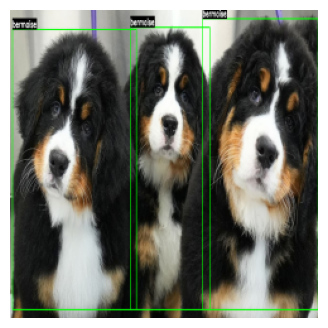

In [ ]:
bermaise_anotations = [
    ("bermaise", 800, 20, 1280, 700),
    ("bermaise", 10, 45, 525, 700),
    ("bermaise", 500, 40, 830, 700),
]
plot_annotations("bermaise.jpg", bermaise_anotations)

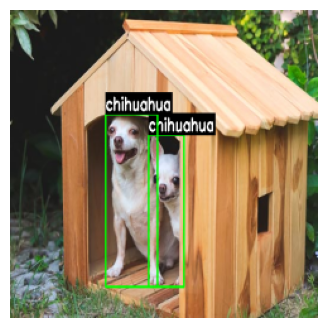

In [ ]:
chihuahuas_anotations = [
    ("chihuahua", 235, 150, 295, 333),
    ("chihuahua", 162, 125, 250, 333),
]
plot_annotations("chihuahuas.jpg", chihuahuas_anotations)

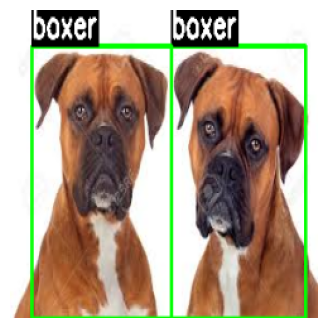

In [ ]:
boxer_anotations = [("boxer", 150, 20, 275, 175), ("boxer", 20, 20, 150, 175)]
plot_annotations("boxer.jpg", boxer_anotations)

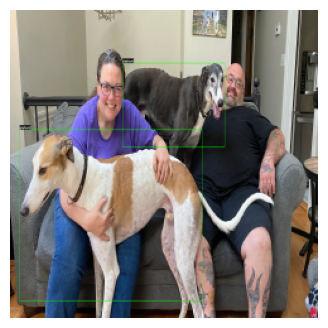

In [ ]:
greyhound_anotations = [
    ("greyhound", 1170, 310, 2230, 800),
    ("greyhound", 100, 700, 2000, 1700),
]
plot_annotations("greyhound.jpg", greyhound_anotations)

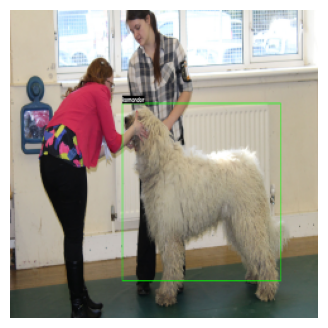

In [ ]:
komondor_anotations = [("komondor", 560, 310, 1350, 900)]
plot_annotations("komondor.jpg", komondor_anotations)

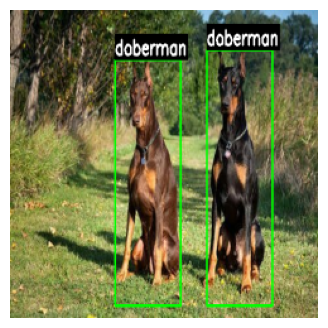

In [ ]:
doberman_anotations = [("doberman", 300, 40, 400, 300), ("doberman", 160, 50, 260, 300)]
plot_annotations("doberman.jpg", doberman_anotations)

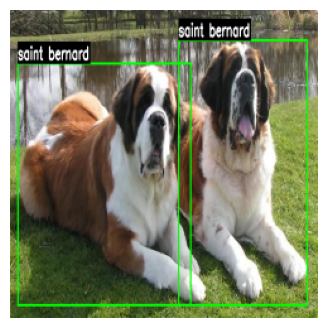

In [ ]:
saint_bernard_anotations = [
    ("saint bernard", 16, 64, 375, 355),
    ("saint bernard", 350, 36, 617, 355),
]
plot_annotations("saint_benard.jpg", saint_bernard_anotations)

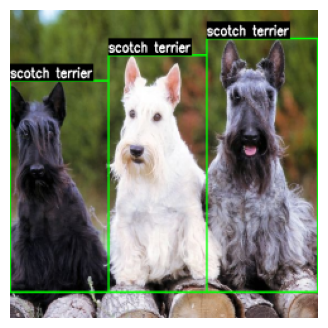

In [ ]:
scotch_terrier_anotations = [
    ("scotch terrier", 360, 44, 563, 440),
    ("scotch terrier", 180, 70, 360, 440),
    ("scotch terrier", 0, 110, 180, 440),
]
plot_annotations("scotch_terrier.jpg", scotch_terrier_anotations)

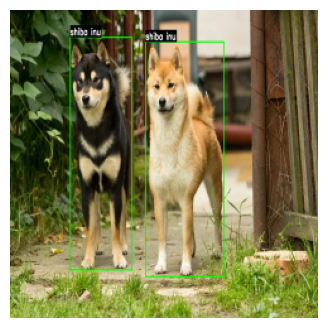

In [ ]:
shiba_inu_anotations = [
    ("shiba inu", 450, 70, 710, 590),
    ("shiba inu", 200, 60, 405, 575),
]
plot_annotations("shiba_inu.jpg", shiba_inu_anotations)

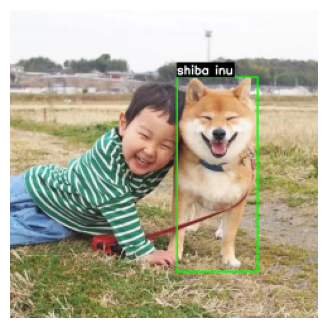

In [ ]:
shiba_inu_kid_anotations = [("shiba inu", 300, 120, 445, 470)]
plot_annotations("shiba_inu_kid.jpg", shiba_inu_kid_anotations)

## Evaluación de pipeline


In [ ]:
from sklearn.metrics import (
    precision_score,
    recall_score,
    f1_score,
    average_precision_score,
)
import numpy as np
import cv2
import matplotlib.pyplot as plt


def calculate_iou(boxA, boxB):
    """Calcula IoU entre dos bounding boxes"""
    xA = max(boxA[0], boxB[0])
    yA = max(boxA[1], boxB[1])
    xB = min(boxA[2], boxB[2])
    yB = min(boxA[3], boxB[3])
    interArea = max(0, xB - xA) * max(0, yB - yA)

    boxAArea = (boxA[2] - boxA[0]) * (boxA[3] - boxA[1])
    boxBArea = (boxB[2] - boxB[0]) * (boxB[3] - boxB[1])
    unionArea = float(boxAArea + boxBArea - interArea)

    return interArea / unionArea if unionArea > 0 else 0


def evaluate_pipeline(
    pipeline,
    test_images,
    true_annotations,
    iou_threshold=0.5,
    image_dir="imagenes_complejas",
    show_images=True,
):
    y_true = []
    y_pred = []
    iou_scores = []
    all_classes = set()

    # Primera pasada para recolectar todas las clases
    for gt_boxes in true_annotations:
        for gt_label, *_ in gt_boxes:
            all_classes.add(gt_label)
    for img_name, _ in zip(test_images, true_annotations):
        img_path = f"{image_dir}/{img_name}"
        img = cv2.imread(img_path)
        _, pred_boxes = pipeline.process_image(img)
        for pred_label, _ in pred_boxes:
            all_classes.add(pred_label)

    # Convertir a lista y añadir la clase negativa
    all_classes = list(all_classes)
    if "no_dog" not in all_classes:
        all_classes.append("no_dog")

    # Segunda pasada para evaluación
    for img_name, gt_boxes in zip(test_images, true_annotations):
        img_path = f"{image_dir}/{img_name}"
        img = cv2.imread(img_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        _, pred_boxes = pipeline.process_image(img)
        annotated_img = img
        matched_gt = set()
        used_pred = set()

        for pred_label, pred_box in pred_boxes:
            best_iou = 0
            best_match = -1
            for i, (gt_label, *gt_box) in enumerate(gt_boxes):
                iou = calculate_iou(pred_box, gt_box)
                if iou >= iou_threshold and iou > best_iou and i not in matched_gt:
                    best_iou = iou
                    best_match = i

            if best_match != -1:
                gt_label = gt_boxes[best_match][0]
                matched_gt.add(best_match)
                used_pred.add(pred_box)
                y_true.append(gt_label)
                y_pred.append(pred_label)
                iou_scores.append(best_iou)
            else:
                y_true.append("no_dog")
                y_pred.append(pred_label)

        for i, (gt_label, *gt_box) in enumerate(gt_boxes):
            if i not in matched_gt:
                y_true.append(gt_label)
                y_pred.append("no_dog")

        if show_images:
            for label, x1, y1, x2, y2 in gt_boxes:
                cv2.rectangle(annotated_img, (x1, y1), (x2, y2), (0, 255, 0), 2)
                cv2.putText(
                    annotated_img,
                    f"GT: {label}",
                    (x1, y1 + 55),
                    cv2.FONT_HERSHEY_SIMPLEX,
                    1,
                    (0, 255, 0),
                    3,
                )
            for label, (x1, y1, x2, y2) in pred_boxes:
                cv2.rectangle(annotated_img, (x1, y1), (x2, y2), (255, 0, 0), 2)
                cv2.putText(
                    annotated_img,
                    f"P: {label}",
                    (x1, y2 - 25),
                    cv2.FONT_HERSHEY_SIMPLEX,
                    1,
                    (255, 0, 0),
                    3,
                )
            plt.figure(figsize=(8, 8))
            plt.imshow(annotated_img)
            plt.title(img_name)
            plt.axis("off")
            plt.show()

    # Calcular métricas
    precision = precision_score(y_true, y_pred, average="weighted", zero_division=0)
    recall = recall_score(y_true, y_pred, average="weighted", zero_division=0)
    f1 = f1_score(y_true, y_pred, average="weighted", zero_division=0)
    mean_iou = np.mean(iou_scores) if iou_scores else 0.0

    # Calcular mAP
    mAP = 0.0
    if len(all_classes) > 1:
        # Filtrar clases que existen en el ground truth
        present_classes = set(y_true) - {"no_dog"}
        valid_classes = [
            cls for cls in all_classes if cls in present_classes and cls != "no_dog"
        ]

        if valid_classes:
            y_true_binarized = np.array(
                [[1 if y == cls else 0 for cls in valid_classes] for y in y_true]
            )
            y_pred_binarized = np.array(
                [[1 if y == cls else 0 for cls in valid_classes] for y in y_pred]
            )

            ap_scores = []
            for i in range(y_true_binarized.shape[1]):
                try:
                    ap = average_precision_score(
                        y_true_binarized[:, i], y_pred_binarized[:, i]
                    )
                    ap_scores.append(ap)
                except ValueError:
                    continue

            mAP = np.mean(ap_scores) if ap_scores else 0.0

    return {
        "Precision": precision,
        "Recall": recall,
        "F1-Score": f1,
        "Mean IoU": mean_iou,
        "mAP@0.5": mAP,
    }


0: 384x640 3 dogs, 10.4ms
Speed: 2.2ms preprocess, 10.4ms inference, 2.0ms postprocess per image at shape (1, 3, 384, 640)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step

0: 480x640 1 dog, 10.0ms
Speed: 2.7ms preprocess, 10.0ms inference, 1.8ms postprocess per image at shape (1, 3, 480, 640)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step

0: 416x640 3 dogs, 10.3ms
Speed: 2.2ms preprocess, 10.3ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step

0: 384x640 2 persons, 2 dogs, 1 chair, 10.0ms
Speed: 2.7ms preprocess, 10.0ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step

0: 448x640 2 persons, 1 bear, 10.4ms
Speed: 2.9ms preprocess, 10.4ms inference, 1.8ms postprocess per image at shape (1, 3, 448, 640)

0: 448x

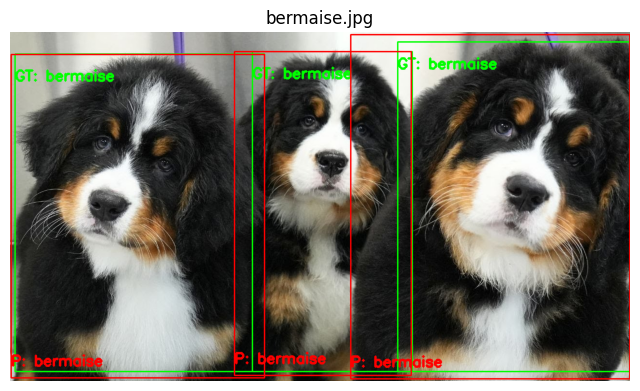


0: 480x640 1 dog, 11.9ms
Speed: 3.0ms preprocess, 11.9ms inference, 2.1ms postprocess per image at shape (1, 3, 480, 640)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


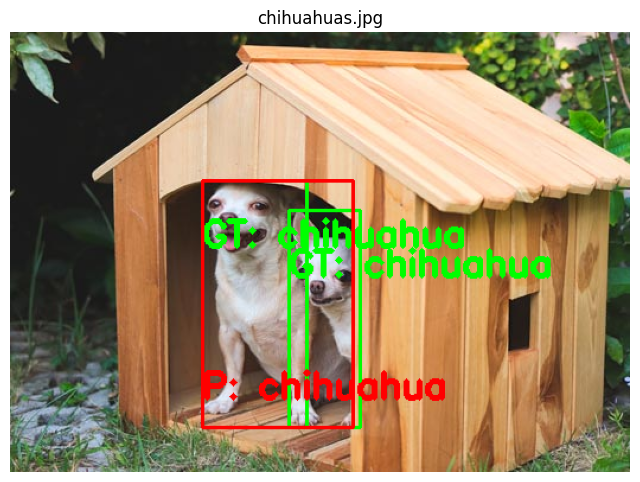


0: 416x640 2 dogs, 9.6ms
Speed: 2.0ms preprocess, 9.6ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


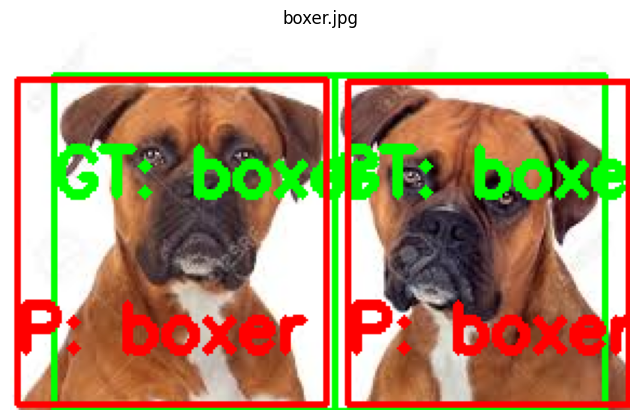


0: 384x640 2 persons, 1 dog, 1 chair, 9.9ms
Speed: 2.8ms preprocess, 9.9ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


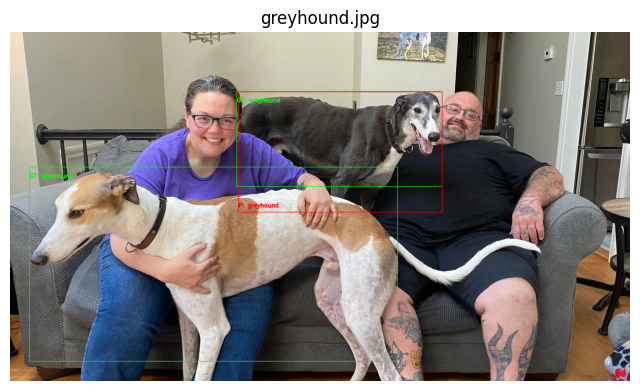


0: 448x640 2 persons, 1 sheep, 1 bear, 9.7ms
Speed: 2.8ms preprocess, 9.7ms inference, 1.7ms postprocess per image at shape (1, 3, 448, 640)


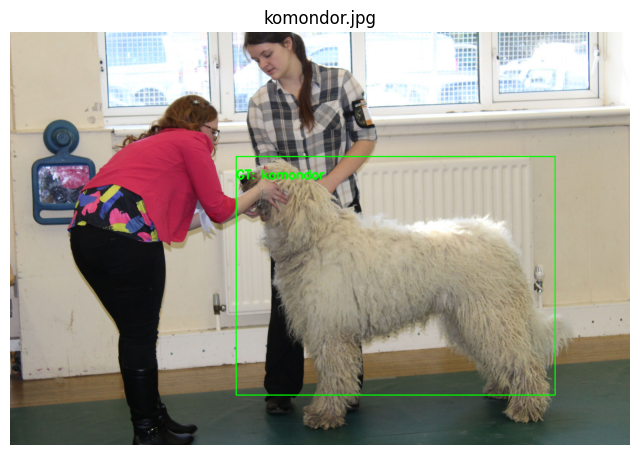


0: 448x640 1 dog, 1 giraffe, 9.2ms
Speed: 2.4ms preprocess, 9.2ms inference, 1.8ms postprocess per image at shape (1, 3, 448, 640)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


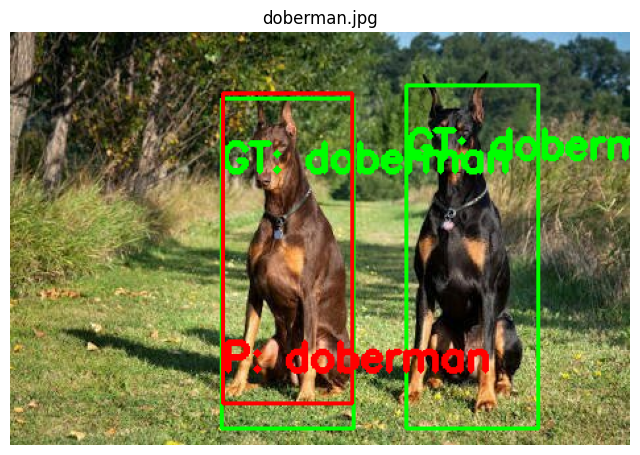


0: 384x640 2 dogs, 10.9ms
Speed: 1.5ms preprocess, 10.9ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


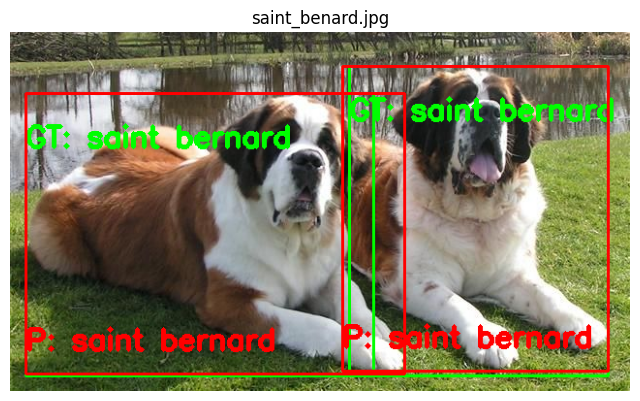


0: 576x640 3 dogs, 10.4ms
Speed: 3.4ms preprocess, 10.4ms inference, 1.7ms postprocess per image at shape (1, 3, 576, 640)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


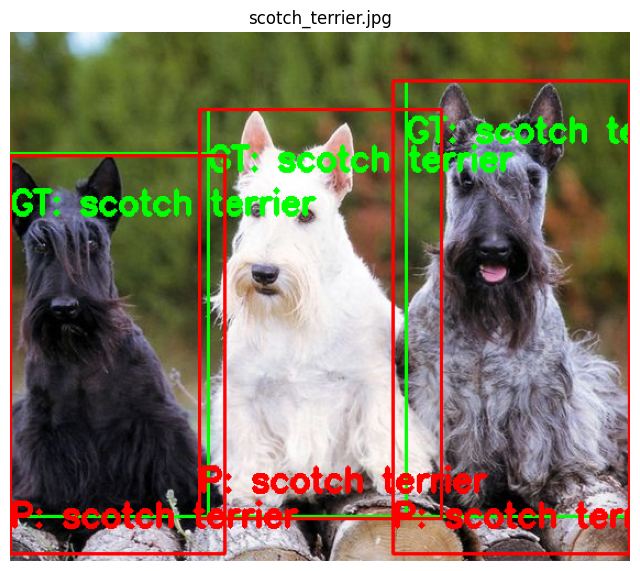


0: 448x640 2 dogs, 10.4ms
Speed: 4.1ms preprocess, 10.4ms inference, 1.7ms postprocess per image at shape (1, 3, 448, 640)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


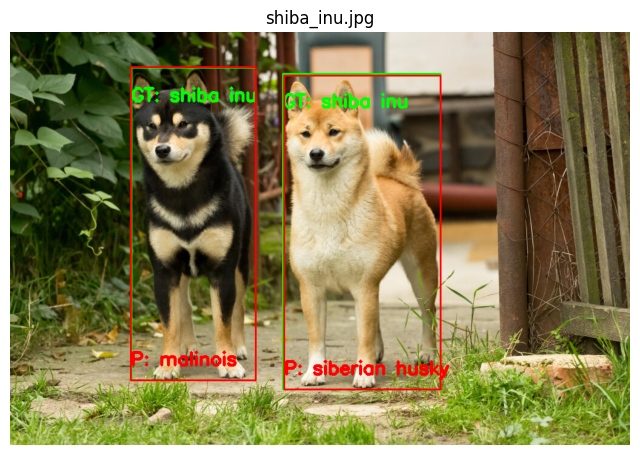


0: 640x640 2 persons, 1 dog, 11.2ms
Speed: 3.6ms preprocess, 11.2ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


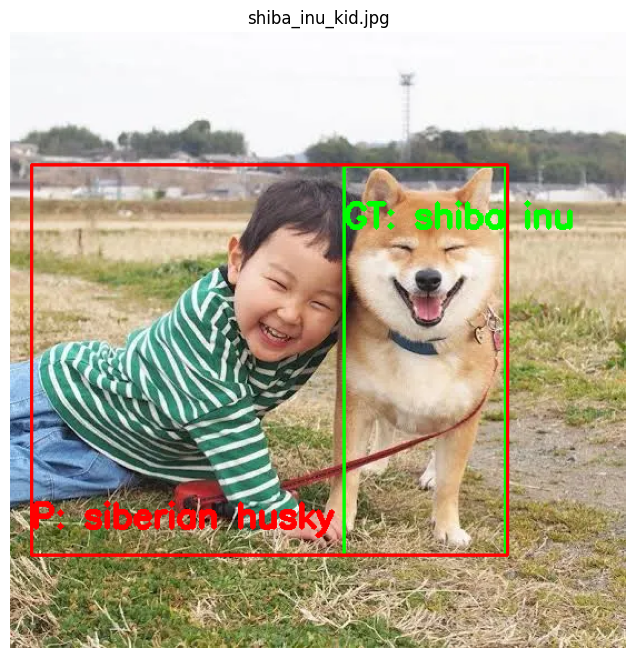

In [ ]:
test_images = [
    "bermaise.jpg",
    "chihuahuas.jpg",
    "boxer.jpg",
    "greyhound.jpg",
    "komondor.jpg",
    "doberman.jpg",
    "saint_benard.jpg",
    "scotch_terrier.jpg",
    "shiba_inu.jpg",
    "shiba_inu_kid.jpg",
]

true_annotations = [
    bermaise_anotations,
    chihuahuas_anotations,
    boxer_anotations,
    greyhound_anotations,
    komondor_anotations,
    doberman_anotations,
    saint_bernard_anotations,
    scotch_terrier_anotations,
    shiba_inu_anotations,
    shiba_inu_kid_anotations,
]

pipeline = DogDetectionClassificationPipeline(
    "yolov8n.pt", modelo_transfer_learning, class_names
)
metrics = evaluate_pipeline(pipeline, test_images, true_annotations, iou_threshold=0.5)

In [ ]:
for k, v in metrics.items():
    print(f"{k}: {v:.4f}")

Precision: 0.7619
Recall: 0.6190
F1-Score: 0.6667
Mean IoU: 0.8699
mAP@0.5: 0.6481


El pipeline de detección y clasificación logró un desempeño moderado en el conjunto de prueba, con métricas clave como Precision: 0.7619 , Recall: 0.6190 , F1-Score: 0.6667 , Mean IoU: 0.8699 y mAP@0.5 : 0.6481 . Estos resultados indican que el modelo tiene una buena precisión en sus detecciones y genera cajas delimitadoras de alta calidad (reflejado en el Mean IoU alto). Sin embargo, el bajo recall (0.6190) revela una dificultad significativa en la detección de perros, lo que limita el rendimiento general del pipeline.

La principal debilidad del pipeline esta en la etapa de detección, donde muchos perros no son detectados o se detectan incorrectamente, afectando negativamente la clasificación posterior. Esto se le puede atribuir a las variaciones en el sobreposicionamiento, postura o contexto de los perros.


## Optimización modelos


In [ ]:
converter = tf.lite.TFLiteConverter.from_keras_model(modelo_transfer_learning)

# Cuantización completa (int8)
converter.optimizations = [tf.lite.Optimize.DEFAULT]
quantized_modelo_transfer_learning = converter.convert()
# Guardar modelo optimizado
with open("Transfer_Learning_INT8.tflite", "wb") as f:
    f.write(quantized_modelo_transfer_learning)

Saved artifact at '/tmp/tmpwckcwuyz'. The following endpoints are available:

* Endpoint 'serve'
  args_0 (POSITIONAL_ONLY): TensorSpec(shape=(None, 144, 144, 3), dtype=tf.float32, name='keras_tensor_375')
Output Type:
  TensorSpec(shape=(None, 70), dtype=tf.float32, name=None)
Captures:
  139035406748176: TensorSpec(shape=(), dtype=tf.resource, name=None)
  139035406748560: TensorSpec(shape=(), dtype=tf.resource, name=None)
  139035406748368: TensorSpec(shape=(), dtype=tf.resource, name=None)
  139035406749328: TensorSpec(shape=(), dtype=tf.resource, name=None)
  139035406747216: TensorSpec(shape=(), dtype=tf.resource, name=None)
  139035406748944: TensorSpec(shape=(), dtype=tf.resource, name=None)
  139035406753168: TensorSpec(shape=(), dtype=tf.resource, name=None)
  139035406753744: TensorSpec(shape=(), dtype=tf.resource, name=None)
  139035406753936: TensorSpec(shape=(), dtype=tf.resource, name=None)
  139035406752784: TensorSpec(shape=(), dtype=tf.resource, name=None)
  139035406

In [ ]:
import time


class classify_image_tflite:
    def __init__(self, model_path: str):
        self.interpreter = tf.lite.Interpreter(model_path=model_path)
        self.interpreter.allocate_tensors()

    def predict(self, image: np.ndarray):
        input_details = self.interpreter.get_input_details()
        output_details = self.interpreter.get_output_details()

        start_time = time.perf_counter()

        self.interpreter.set_tensor(input_details[0]["index"], image)
        self.interpreter.invoke()
        output = self.interpreter.get_tensor(output_details[0]["index"])

        end_time = time.perf_counter()

        # Cálculo del tiempo transcurrido en milisegundos
        elapsed_time_ms = (end_time - start_time) * 1000
        print(f"Tiempo de inferencia: {elapsed_time_ms:.2f} milisegundos")

        return output


0: 384x640 3 dogs, 9.5ms
Speed: 2.1ms preprocess, 9.5ms inference, 2.0ms postprocess per image at shape (1, 3, 384, 640)
Tiempo de inferencia: 18.57 milisegundos
Tiempo de inferencia: 18.16 milisegundos
Tiempo de inferencia: 18.07 milisegundos

0: 480x640 1 dog, 9.4ms
Speed: 2.9ms preprocess, 9.4ms inference, 1.7ms postprocess per image at shape (1, 3, 480, 640)
Tiempo de inferencia: 18.39 milisegundos

0: 416x640 3 dogs, 9.5ms
Speed: 2.3ms preprocess, 9.5ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
Tiempo de inferencia: 18.46 milisegundos
Tiempo de inferencia: 18.47 milisegundos
Tiempo de inferencia: 18.89 milisegundos

0: 384x640 2 persons, 2 dogs, 1 chair, 9.6ms
Speed: 2.9ms preprocess, 9.6ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)
Tiempo de inferencia: 18.42 milisegundos
Tiempo de inferencia: 18.37 milisegundos

0: 448x640 2 persons, 1 bear, 10.0ms
Speed: 3.1ms preprocess, 10.0ms inference, 1.7ms postprocess per image at shape (1, 3,

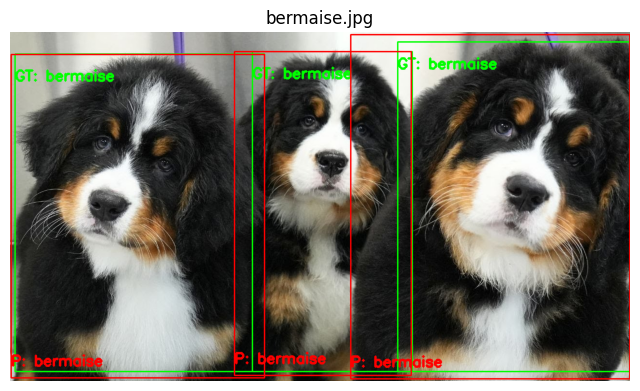


0: 480x640 1 dog, 11.1ms
Speed: 3.6ms preprocess, 11.1ms inference, 1.7ms postprocess per image at shape (1, 3, 480, 640)
Tiempo de inferencia: 18.41 milisegundos


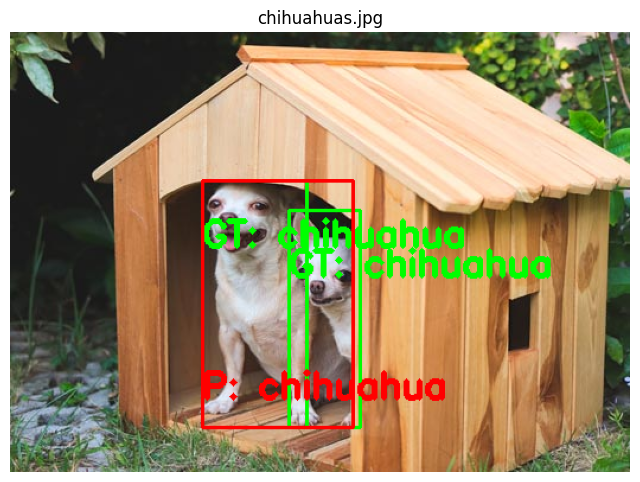


0: 416x640 2 dogs, 11.1ms
Speed: 2.8ms preprocess, 11.1ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
Tiempo de inferencia: 18.74 milisegundos
Tiempo de inferencia: 18.58 milisegundos


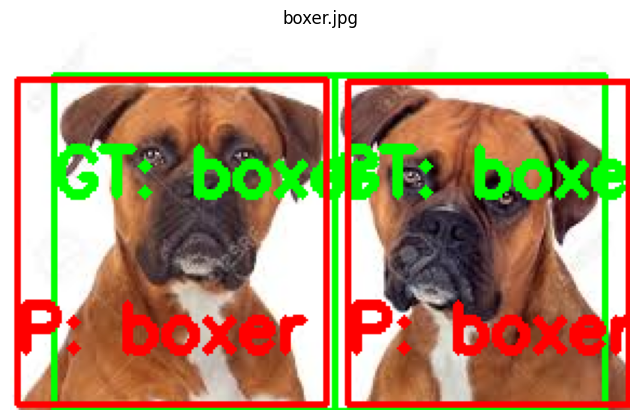


0: 384x640 2 persons, 1 dog, 1 chair, 9.8ms
Speed: 3.4ms preprocess, 9.8ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)
Tiempo de inferencia: 18.45 milisegundos


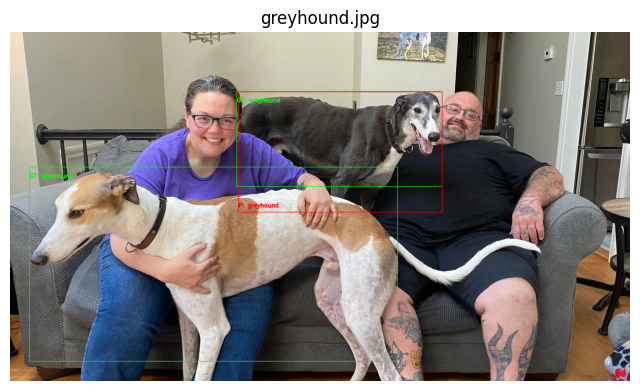


0: 448x640 2 persons, 1 sheep, 1 bear, 9.9ms
Speed: 2.9ms preprocess, 9.9ms inference, 1.8ms postprocess per image at shape (1, 3, 448, 640)


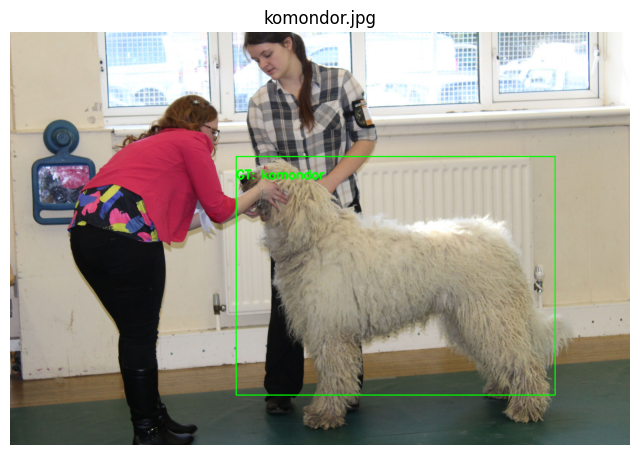


0: 448x640 1 dog, 1 giraffe, 9.9ms
Speed: 2.3ms preprocess, 9.9ms inference, 1.8ms postprocess per image at shape (1, 3, 448, 640)
Tiempo de inferencia: 18.34 milisegundos


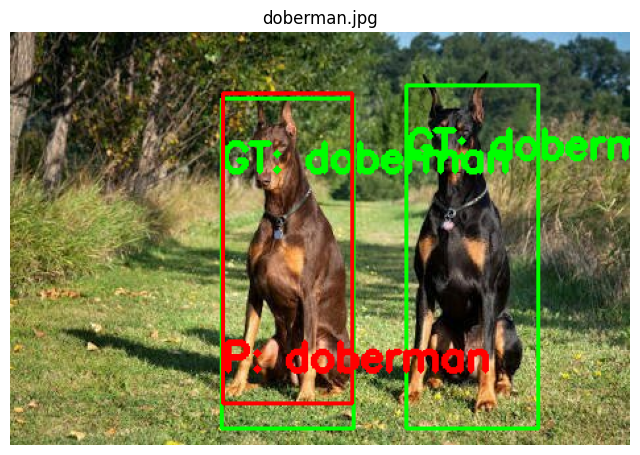


0: 384x640 2 dogs, 10.1ms
Speed: 1.5ms preprocess, 10.1ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)
Tiempo de inferencia: 18.36 milisegundos
Tiempo de inferencia: 18.09 milisegundos


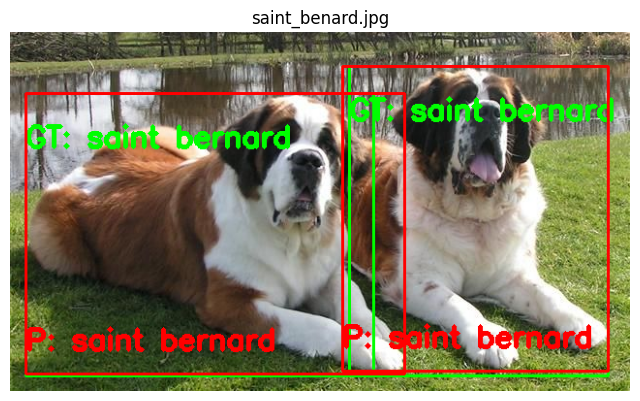


0: 576x640 3 dogs, 9.8ms
Speed: 3.1ms preprocess, 9.8ms inference, 1.7ms postprocess per image at shape (1, 3, 576, 640)
Tiempo de inferencia: 18.49 milisegundos
Tiempo de inferencia: 18.37 milisegundos
Tiempo de inferencia: 18.18 milisegundos


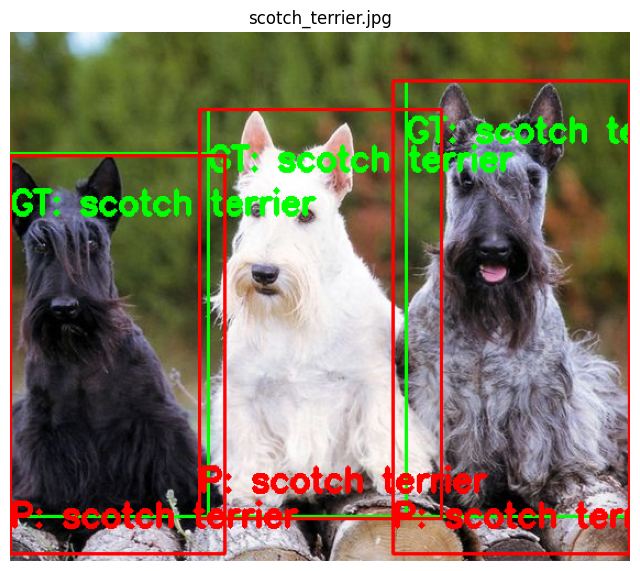


0: 448x640 2 dogs, 9.8ms
Speed: 2.6ms preprocess, 9.8ms inference, 1.7ms postprocess per image at shape (1, 3, 448, 640)
Tiempo de inferencia: 18.31 milisegundos
Tiempo de inferencia: 18.23 milisegundos


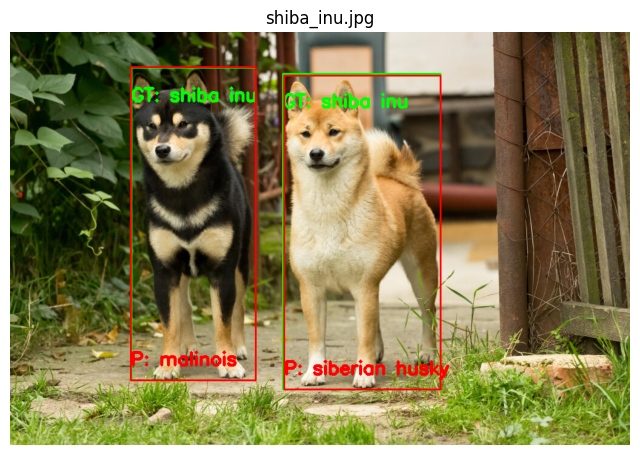


0: 640x640 2 persons, 1 dog, 9.8ms
Speed: 3.2ms preprocess, 9.8ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)
Tiempo de inferencia: 18.77 milisegundos


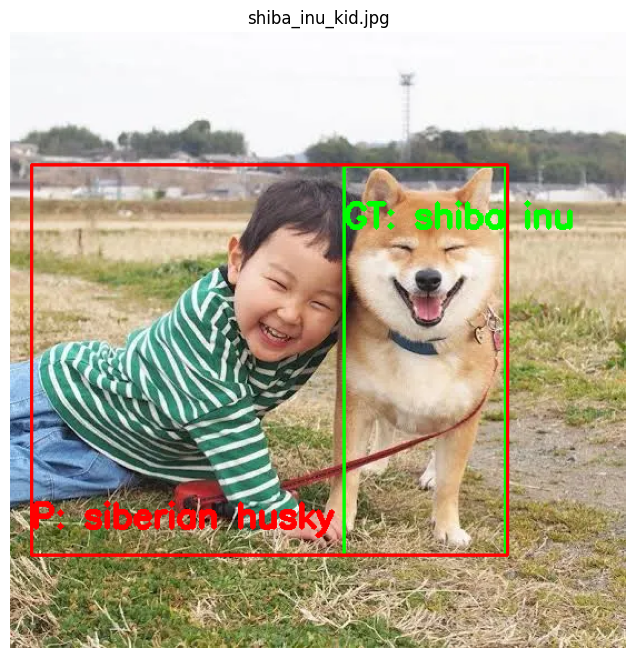

Precision: 0.7619
Recall: 0.6190
F1-Score: 0.6667
Mean IoU: 0.8699
mAP@0.5: 0.6481


In [ ]:
interpreter = classify_image_tflite("Transfer_Learning_INT8.tflite")
pipeline_lite = DogDetectionClassificationPipeline(
    "yolov8n.pt", interpreter, class_names
)
metrics = evaluate_pipeline(
    pipeline_lite, test_images, true_annotations, iou_threshold=0.5
)

for k, v in metrics.items():
    print(f"{k}: {v:.4f}")

Se observa que el desempeño del modelo cuantizado a INT8 es igual de bueno que el modelo base, pero con una velocidad de predicion el doble de rapida (aprox. 20ms) comparada con el modelo base (aprox. 40ms)


## Script de anotacion automatica


In [ ]:
from typing import Any


class AnnotationExporter:
    @staticmethod
    def to_yolo(
        image_width: int,
        image_height: int,
        predictions: list[tuple[str, tuple[int, int, int, int]]],
        class_map: dict[str, int],
    ) -> list[str]:
        """Convierte las predicciones a formato YOLO."""
        yolo_annotations = []

        for class_name, (x1, y1, x2, y2) in predictions:
            # Convertir a coordenadas normalizadas YOLO
            x_center = ((x1 + x2) / 2) / image_width
            y_center = ((y1 + y2) / 2) / image_height
            width = (x2 - x1) / image_width
            height = (y2 - y1) / image_height

            class_id = class_map[class_name]
            yolo_annotations.append(
                f"{class_id} {x_center:.6f} {y_center:.6f} {width:.6f} {height:.6f}"
            )

        return yolo_annotations

    @staticmethod
    def to_coco(
        images: list[dict], annotations: list[dict], categories: list[dict]
    ) -> dict[str, Any]:
        """Crea un archivo COCO JSON con las anotaciones."""
        return {
            "images": images,
            "annotations": annotations,
            "categories": categories,
            "info": {},
            "licenses": [],
        }

In [ ]:
import json


def script_anotacion(
    pipeline: DogDetectionClassificationPipeline,
    input_folder: str,
    output_folder: str,
    class_map: dict[str, int],
    save_annotated_images: bool = True,
) -> None:
    """Procesa todas las imágenes en una carpeta y exporta anotaciones.

    Args:
        pipeline: Pipeline de detección/clasificación
        input_folder (str): Carpeta con imágenes de entrada
        output_folder (str): Carpeta para guardar resultados
        class_map (Dict): Mapeo de nombre de clase a ID
        save_annotated_images (bool): Si guardar imágenes anotadas
    """
    # Crear carpetas de salida si no existen
    os.makedirs(output_folder, exist_ok=True)
    yolo_folder = os.path.join(output_folder, "yolo_annotations")
    coco_folder = os.path.join(output_folder, "coco_annotations")
    os.makedirs(yolo_folder, exist_ok=True)
    os.makedirs(coco_folder, exist_ok=True)

    if save_annotated_images:
        annotated_folder = os.path.join(output_folder, "annotated_images")
        os.makedirs(annotated_folder, exist_ok=True)

    # Preparar estructura COCO
    coco_images = []
    coco_annotations = []
    coco_categories = [{"id": v, "name": k} for k, v in class_map.items()]
    annotation_id = 1

    # Procesar cada imagen en la carpeta de entrada
    for filename in os.listdir(input_folder):
        if filename.lower().endswith((".png", ".jpg", ".jpeg")):
            image_path = os.path.join(input_folder, filename)
            image = cv2.imread(image_path)
            image_height, image_width = image.shape[:2]

            # Procesar imagen
            annotated_image, predictions = pipeline.process_image(image)

            # Guardar imagen anotada si se requiere
            if save_annotated_images:
                output_path = os.path.join(annotated_folder, filename)
                cv2.imwrite(output_path, annotated_image)

            # Exportar a YOLO format
            yolo_annos = AnnotationExporter.to_yolo(
                image_width, image_height, predictions, class_map
            )
            yolo_path = os.path.join(
                yolo_folder, os.path.splitext(filename)[0] + ".txt"
            )
            with open(yolo_path, "w") as f:
                f.write("\n".join(yolo_annos))

            # Preparar datos para COCO
            image_id = len(coco_images) + 1
            coco_images.append(
                {
                    "id": image_id,
                    "width": image_width,
                    "height": image_height,
                    "file_name": filename,
                    "license": 0,
                    "date_captured": "",
                }
            )

            for class_name, (x1, y1, x2, y2) in predictions:
                width = x2 - x1
                height = y2 - y1

                coco_annotations.append(
                    {
                        "id": annotation_id,
                        "image_id": image_id,
                        "category_id": class_map[class_name],
                        "bbox": [x1, y1, width, height],
                        "area": width * height,
                        "segmentation": [],
                        "iscrowd": 0,
                    }
                )
                annotation_id += 1

    # Guardar COCO JSON
    coco_data = AnnotationExporter.to_coco(
        coco_images, coco_annotations, coco_categories
    )
    coco_path = os.path.join(coco_folder, "annotations.json")
    with open(coco_path, "w") as f:
        json.dump(coco_data, f, indent=2)

In [ ]:
DETECTION_MODEL = "yolov8n.pt"
# CLASSIFICATION_MODEL = tf.keras.models.load_model("modelo_transfer_learning.h5")
CLASSIFICATION_MODEL = modelo_transfer_learning
CLASS_NAMES = class_names
CLASS_MAP = {name: idx for idx, name in enumerate(CLASS_NAMES)}

# Crear pipeline
pipeline = DogDetectionClassificationPipeline(
    detection_model=DETECTION_MODEL, model=CLASSIFICATION_MODEL, class_names=CLASS_NAMES
)

# Procesar carpeta
script_anotacion(
    pipeline=pipeline,
    input_folder="imagenes_complejas",
    output_folder="anotaciones",
    class_map=CLASS_MAP,
    save_annotated_images=True,
)



0: 384x640 2 persons, 2 dogs, 1 chair, 9.3ms
Speed: 2.6ms preprocess, 9.3ms inference, 2.1ms postprocess per image at shape (1, 3, 384, 640)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step

0: 640x512 1 dog, 2 horses, 9.7ms
Speed: 3.6ms preprocess, 9.7ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 512)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step

0: 416x640 3 dogs, 9.7ms
Speed: 2.1ms preprocess, 9.7ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step

0: 384x640 2 dogs, 9.9ms
Speed: 1.5ms preprocess, 9.9ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step

0: 448x640 2 persons, 1 bear, 9.6ms
Speed: 2.7ms preprocess, 9.6ms inference, 1.7ms postprocess per image at shape (1, 3, 448, 640)

0: 448x640 2 dogs, 8.9ms
Speed: 2.6ms preproc